In [282]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from scipy.stats import pearsonr
from suite2p.extraction import dcnv
import math
from scipy.stats import pearsonr

In [209]:
input_path = '/Volumes/Behaviour/Tailored 3sec 2P Trials/PCA/PCA UpSampled'
output_path = '/Volumes/Behaviour/Tailored 3sec 2P Trials/PCA/pca_beh_correlations'
beh_path = '/Volumes/Behaviour/2P behaviour traces'

paw_dy = pd.read_csv('/Volumes/Behaviour/2P behaviour traces/paw_dy_traces.csv', index_col=0)
paw_y = pd.read_csv('/Volumes/Behaviour/2P behaviour traces/paw_y_traces.csv', index_col=0)
hog_intensity = pd.read_csv('/Volumes/Behaviour/2P behaviour traces/PC_intensity_traces.csv', index_col=0)
hog_spon = pd.read_csv('/Volumes/Behaviour/2P behaviour traces/PC_spon_traces.csv', index_col=0)
hog_vig = pd.read_csv('/Volumes/Behaviour/2P behaviour traces/PC_vig_traces.csv', index_col=0)

stimuli = ['warm', 'hot', 'opto', 'off-target', 'von frey', 'pin-prick', 'approach', 'no stim']

In [170]:
# PAW AND HOG FILES DO NOT HAVE THE SAME NUMBER OF TRIALS: FIND THE COMMON ONES AND DISCARD THE OTHER ONES
hog_trials = set(list(hog_vig.columns))
print(len(hog_trials))
paw_trials = set(list(paw_y.columns))
print(len(paw_trials))
com_trials = list(hog_trials.intersection(paw_trials))
len(com_trials)


1107
1082


1068

In [312]:
# SMOOTHE THAN GCAMP6 CONVOLVE PAW_DY (FROM FRAME -611 TO FRAME 632 = 1244 FRAMES)
traces = []

for t, trial in enumerate(com_trials):
    trace = paw_dy.loc[:,trial].rolling(65).mean()
    trace = trace.loc[-611:632]
    trace = trace.interpolate(method='linear', limit_direction='both') # fill NaN cells by linear interpolation
    traces.append(np.array(trace))
        
trace_array = np.array(traces)
convolved = dcnv.oasis(F=trace_array, batch_size=200, tau=1.25, fs=400)
conv_paw_dy = pd.DataFrame(convolved.T, columns=com_trials)
conv_paw_dy = conv_paw_dy.interpolate(method='linear', limit_direction='both')
frames = np.arange(-611, 633, 1)
conv_paw_dy['frame'] = frames
conv_paw_dy.to_csv(os.path.join(beh_path, 'conv_paw_dy.csv'))
conv_paw_dy.head()

,2P10_Ses04_09DEC2021_no stim_Trial_3_13595,2P09_Ses05_09DEC2021_von frey_Trial_6_61834,2P11_Ses04_09DEC2021_off-target_Trial_1_48642,2P11_Ses06_13DEC2021_von frey_Trial_1_91913,2P09_Ses02_06DEC2021_no stim_Trial_2_84974,2P09_Ses03_07DEC2021_von frey_Trial_1_13176,2P06_Ses05_03NOV2021_opto_Trial_1_92558,2P11_Ses02_07DEC2021_approach_Trial_1_42516,2P05_Ses07_09NOV2021_pin-prick_Trial_3_13177,2P09_CFA_15DEC2021_opto_Trial_1_57585,...,2P11_Ses02_07DEC2021_warm_Trial_1_74223,2P10_CFA_15DEC2021_warm_Trial_1_20252,2P08_CFA_30NOV2021_von frey_Trial_1_59341,2P10_Ses04_09DEC2021_approach_Trial_3_51639,2P08_Ses03_17NOV2021_no stim_Trial_3_74073,2P11_CFA_15DEC2021_von frey_Trial_3_92166,2P07_Ses02_11NOV2021_opto_Trial_5_62874,2P10_Ses03_08DEC2021_warm_Trial_2_44265,2P06_Ses02_28OCT2021_hot_Trial_3_40522,frame
0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,-611
1,0.0,0.000000,0.000000,0.0,0.0,0.000224,0.000642,0.0,0.000256,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000453,0.0,0.000730,0.0,-610
2,0.0,0.000000,0.000000,0.0,0.0,0.000224,0.000193,0.0,0.000141,0.0,...,0.000560,0.0,0.0,0.0,0.0,0.000000,0.0,0.000433,0.0,-609
3,0.0,0.000205,0.000000,0.0,0.0,0.000224,0.000000,0.0,0.000000,0.0,...,0.000180,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,-608
4,0.0,0.000000,0.000014,0.0,0.0,0.000224,0.000000,0.0,0.000000,0.0,...,0.000561,0.0,0.0,0.0,0.0,0.000000,0.0,0.000626,0.0,-607


In [313]:
# SMOOTHE THAN GCAMP6 CONVOLVE PAW_Y (FROM FRME -611 TO FRAME 632 = 1244 FRAMES)
traces = []

for t, trial in enumerate(com_trials):
    trace = paw_y.loc[:,trial].rolling(65).mean()
    trace = trace.loc[-611:632]
    trace = trace.interpolate(method='linear', limit_direction='both') # fill NaN cells by linear interpolation 
    traces.append(trace)
        
trace_array = np.array(traces)
convolved = dcnv.oasis(F=trace_array, batch_size=200, tau=1.25, fs=400)
conv_paw_y = pd.DataFrame(convolved.T, columns=com_trials)
conv_paw_y = conv_paw_y.interpolate(method='linear', limit_direction='both')
frames = np.arange(-611, 633, 1)
conv_paw_y['frame'] = frames
conv_paw_y.to_csv(os.path.join(beh_path, 'conv_paw_y.csv'))
conv_paw_y.head()

,2P10_Ses04_09DEC2021_no stim_Trial_3_13595,2P09_Ses05_09DEC2021_von frey_Trial_6_61834,2P11_Ses04_09DEC2021_off-target_Trial_1_48642,2P11_Ses06_13DEC2021_von frey_Trial_1_91913,2P09_Ses02_06DEC2021_no stim_Trial_2_84974,2P09_Ses03_07DEC2021_von frey_Trial_1_13176,2P06_Ses05_03NOV2021_opto_Trial_1_92558,2P11_Ses02_07DEC2021_approach_Trial_1_42516,2P05_Ses07_09NOV2021_pin-prick_Trial_3_13177,2P09_CFA_15DEC2021_opto_Trial_1_57585,...,2P11_Ses02_07DEC2021_warm_Trial_1_74223,2P10_CFA_15DEC2021_warm_Trial_1_20252,2P08_CFA_30NOV2021_von frey_Trial_1_59341,2P10_Ses04_09DEC2021_approach_Trial_3_51639,2P08_Ses03_17NOV2021_no stim_Trial_3_74073,2P11_CFA_15DEC2021_von frey_Trial_3_92166,2P07_Ses02_11NOV2021_opto_Trial_5_62874,2P10_Ses03_08DEC2021_warm_Trial_2_44265,2P06_Ses02_28OCT2021_hot_Trial_3_40522,frame
0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,-611
1,0.0,0.0,0.0,0.009988,0.009659,0.012978,0.0,0.0,0.0,0.0,...,0.025538,0.0,0.0,0.008787,0.016544,0.0,0.0,0.0,0.0,-610
2,0.0,0.0,0.0,0.009611,0.009651,0.012978,0.0,0.0,0.0,0.0,...,0.025029,0.0,0.0,0.009933,0.017068,0.0,0.0,0.0,0.0,-609
3,0.0,0.0,0.0,0.010132,0.007099,0.012978,0.0,0.0,0.0,0.0,...,0.023797,0.0,0.0,0.008689,0.016959,0.0,0.0,0.0,0.0,-608
4,0.0,0.0,0.0,0.009306,0.007533,0.012978,0.0,0.0,0.0,0.0,...,0.025122,0.0,0.0,0.008268,0.017782,0.0,0.0,0.0,0.0,-607


In [316]:
# SMOOTHE THAN GCAMP6 CONVOLVE HOG_INTENSITY (FROM FRME -611 TO FRAME 632 = 1244 FRAMES)
traces = []

for t, trial in enumerate(com_trials):
    trace = hog_intensity.loc[:,trial].rolling(65).mean()
    trace = np.array(trace.loc[-611:632])
    traces.append(trace)
        
trace_array = np.array(traces)
convolved = dcnv.oasis(F=trace_array, batch_size=200, tau=1.25, fs=400)
conv_hog_inten = pd.DataFrame(convolved.T, columns=com_trials)
frames = np.arange(-611, 633, 1)
conv_hog_inten['frame'] = frames
conv_hog_inten.to_csv(os.path.join(beh_path, 'conv_hog_intensity.csv'))
conv_hog_inten.head()

,2P10_Ses04_09DEC2021_no stim_Trial_3_13595,2P09_Ses05_09DEC2021_von frey_Trial_6_61834,2P11_Ses04_09DEC2021_off-target_Trial_1_48642,2P11_Ses06_13DEC2021_von frey_Trial_1_91913,2P09_Ses02_06DEC2021_no stim_Trial_2_84974,2P09_Ses03_07DEC2021_von frey_Trial_1_13176,2P06_Ses05_03NOV2021_opto_Trial_1_92558,2P11_Ses02_07DEC2021_approach_Trial_1_42516,2P05_Ses07_09NOV2021_pin-prick_Trial_3_13177,2P09_CFA_15DEC2021_opto_Trial_1_57585,...,2P11_Ses02_07DEC2021_warm_Trial_1_74223,2P10_CFA_15DEC2021_warm_Trial_1_20252,2P08_CFA_30NOV2021_von frey_Trial_1_59341,2P10_Ses04_09DEC2021_approach_Trial_3_51639,2P08_Ses03_17NOV2021_no stim_Trial_3_74073,2P11_CFA_15DEC2021_von frey_Trial_3_92166,2P07_Ses02_11NOV2021_opto_Trial_5_62874,2P10_Ses03_08DEC2021_warm_Trial_2_44265,2P06_Ses02_28OCT2021_hot_Trial_3_40522,frame
0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,-611
1,0.194031,0.137975,0.000000,0.0,0.038245,0.151177,0.0,0.0,0.0,0.166882,...,0.0,0.196335,0.105261,0.094725,0.154356,0.061066,0.0,0.073659,0.0,-610
2,0.175991,0.132793,0.095447,0.0,0.052211,0.115852,0.0,0.0,0.0,0.172395,...,0.0,0.177283,0.089724,0.018721,0.136323,0.035330,0.0,0.054679,0.0,-609
3,0.095247,0.109214,0.014364,0.0,0.062566,0.119687,0.0,0.0,0.0,0.122217,...,0.0,0.157810,0.106093,0.040249,0.098192,0.185925,0.0,0.000000,0.0,-608
4,0.102263,0.201494,0.000000,0.0,0.083411,0.102892,0.0,0.0,0.0,0.111939,...,0.0,0.112482,0.058918,0.057520,0.121330,0.063434,0.0,0.020591,0.0,-607


In [295]:
# SMOOTHE THAN GCAMP6 CONVOLVE HOG_SPON (FROM FRAME -611 TO FRAME 632 = 1244 FRAMES)
traces = []

for t, trial in enumerate(com_trials):
    trace = hog_spon.loc[:,trial].rolling(65).mean()
    trace = np.array(trace.loc[-611:632])
    traces.append(trace)
        
trace_array = np.array(traces)
convolved = dcnv.oasis(F=trace_array, batch_size=200, tau=1.25, fs=400)
conv_hog_spon = pd.DataFrame(convolved.T, columns=com_trials)
frames = np.arange(-611, 633, 1)
conv_hog_spon['frame'] = frames
conv_hog_spon.to_csv(os.path.join(beh_path, 'conv_hog_spon.csv'))
conv_hog_spon.shape

(1244, 1069)

In [293]:
# SMOOTHE THAN GCAMP6 CONVOLVE HOG_VIG (FROM FRAME -611 TO FRAME 632 = 1244 FRAMES)
traces = []

for t, trial in enumerate(com_trials):
    trace = hog_vig.loc[:,trial].rolling(65).mean()
    trace = np.array(trace.loc[-611:632])
    traces.append(trace)
        
trace_array = np.array(traces)
convolved = dcnv.oasis(F=trace_array, batch_size=200, tau=1.25, fs=400)
conv_hog_vig = pd.DataFrame(convolved.T, columns=com_trials)
frames = np.arange(-611, 633, 1)
conv_hog_vig['frame'] = frames
conv_hog_vig.to_csv(os.path.join(beh_path, 'conv_hog_vig.csv'))
conv_hog_vig.shape

(1244, 1069)

In [350]:
print(sessions[29])

pca_data_up_2P09_Ses04.csv


43
processing:  pca_data_up_2P06_Ses01.csv
2P06_Ses01
pca shape (29856, 359)
warm


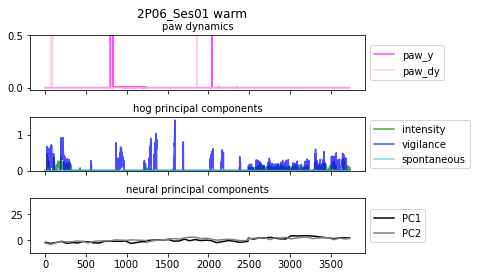

hot


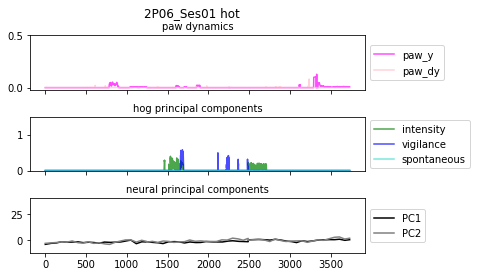

off-target


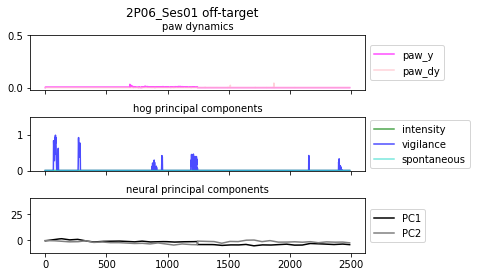

von frey


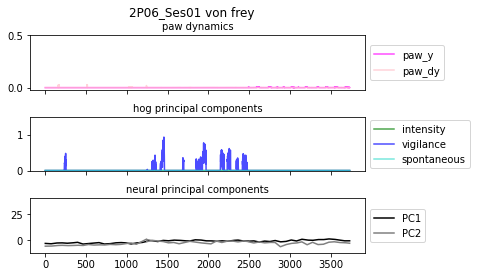

pin-prick


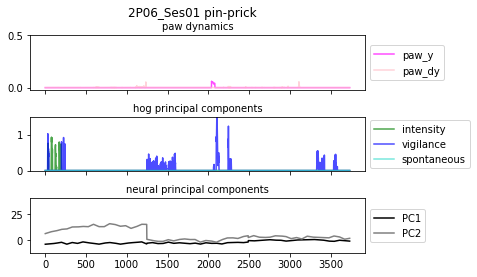

approach


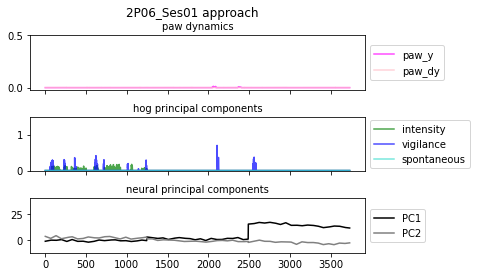

no stim


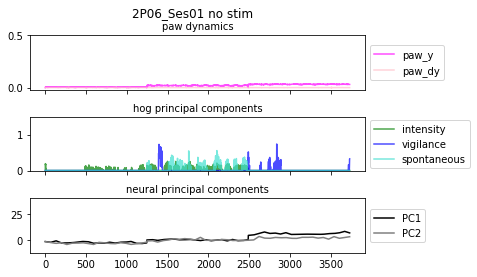

processing:  pca_data_up_2P06_Ses02.csv
2P06_Ses02
pca shape (28612, 374)
warm


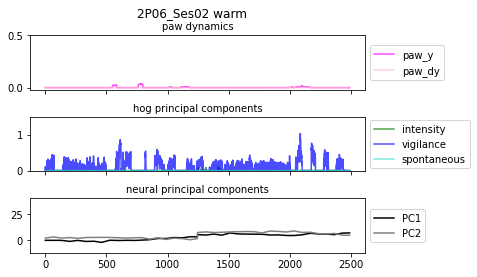

hot


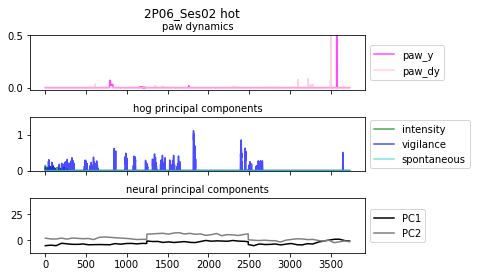

opto


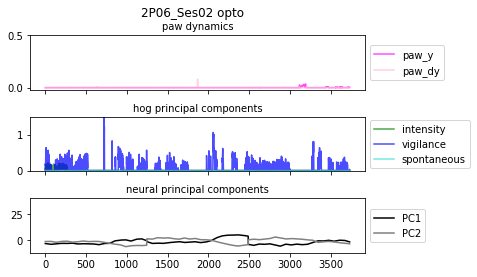

off-target


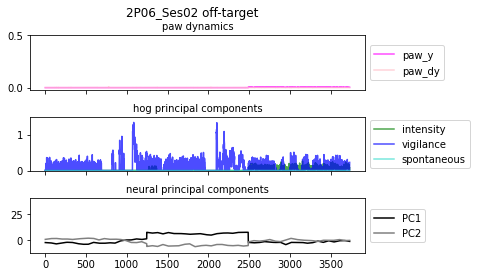

von frey


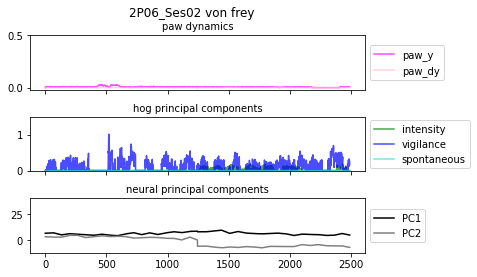

pin-prick


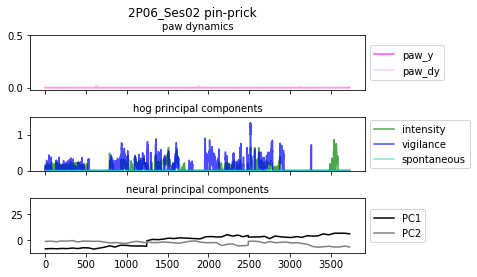

approach


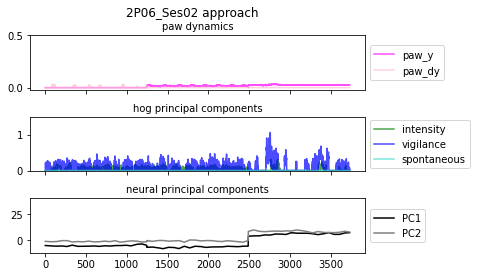

no stim


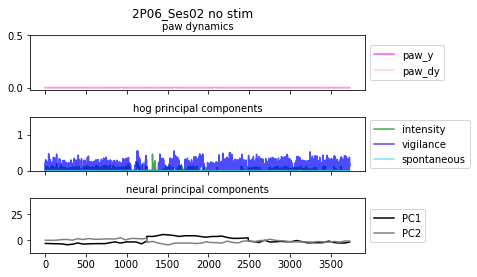

processing:  pca_data_up_2P06_Ses03.csv
2P06_Ses03
pca shape (27368, 284)
warm


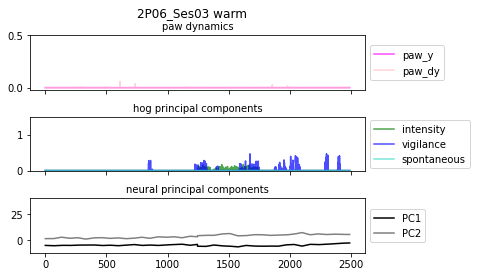

hot


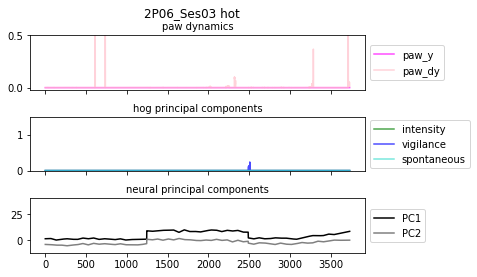

opto


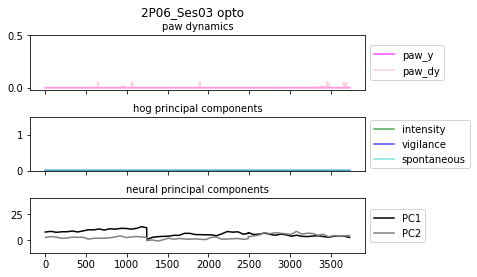

off-target


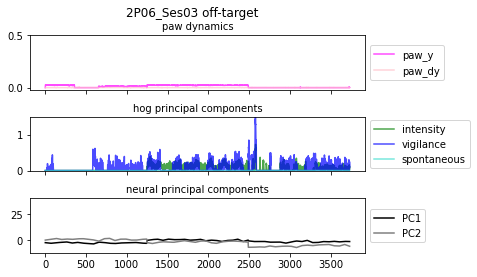

von frey


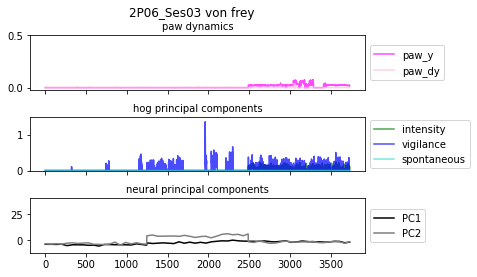

pin-prick


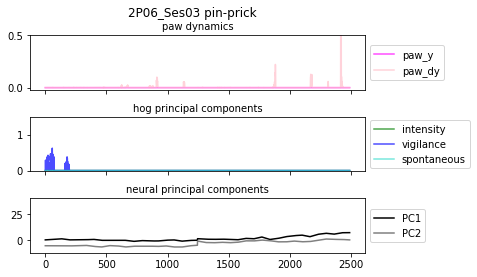

approach


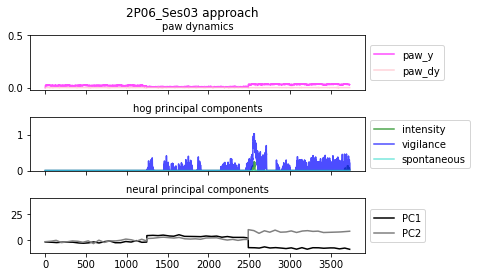

no stim


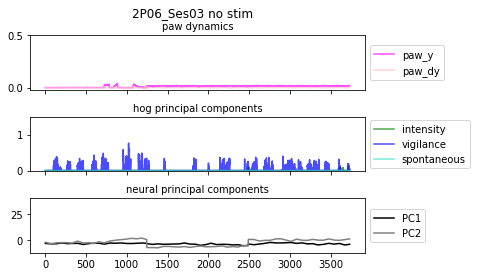

processing:  pca_data_up_2P05_Ses04.csv
2P05_Ses04
pca shape (29856, 331)
warm


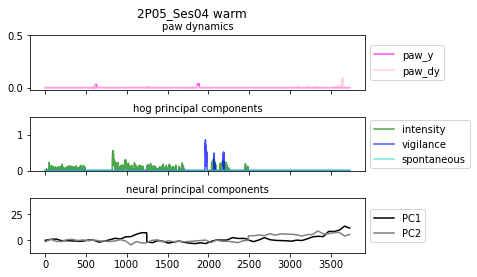

hot


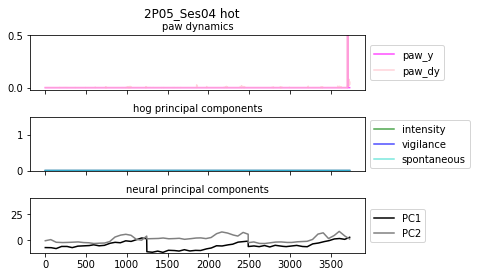

opto


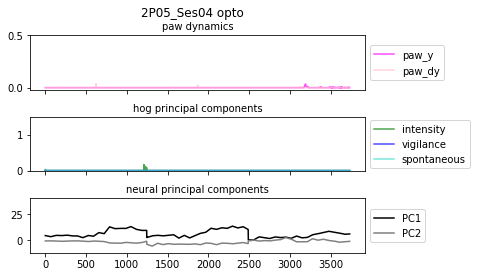

off-target


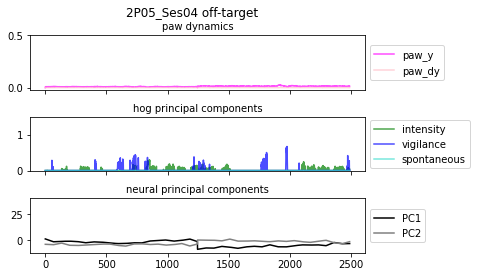

von frey


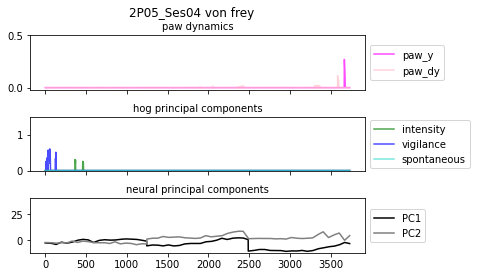

pin-prick


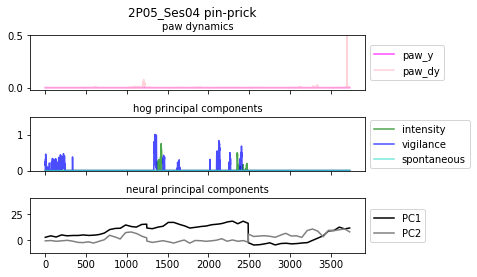

approach


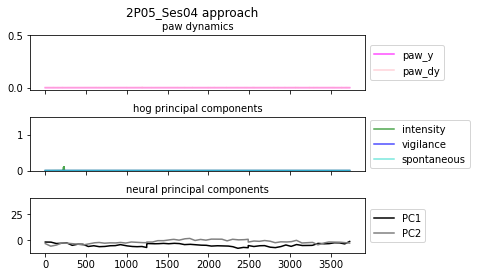

no stim


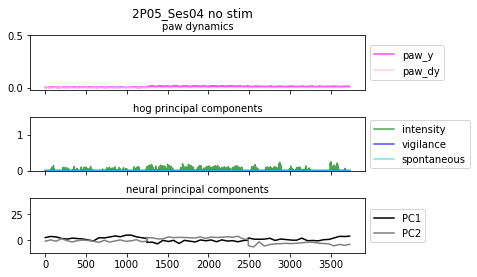

processing:  pca_data_up_2P06_Ses04.csv
2P06_Ses04
pca shape (32344, 365)
warm


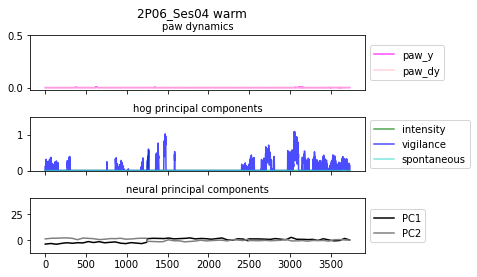

hot


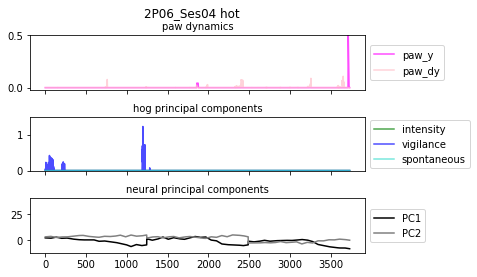

opto


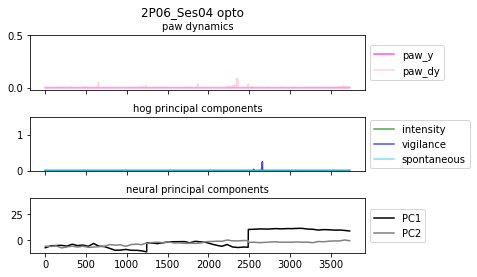

off-target


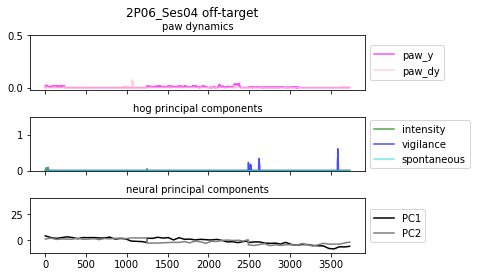

von frey


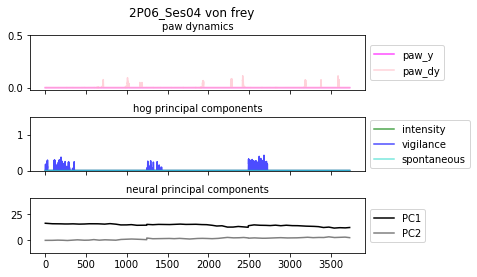

pin-prick


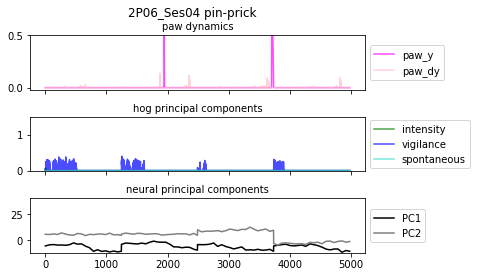

approach


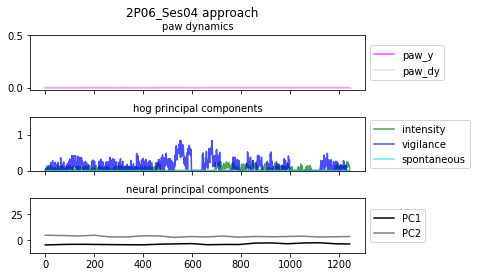

no stim


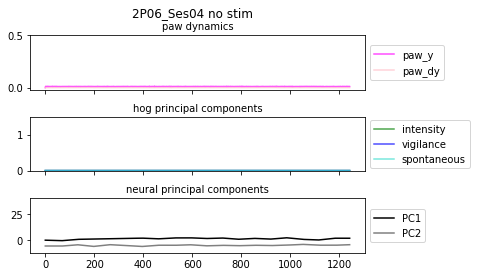

processing:  pca_data_up_2P06_Ses05.csv
2P06_Ses05
pca shape (29856, 213)
warm


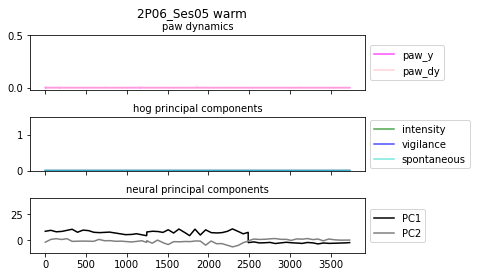

hot


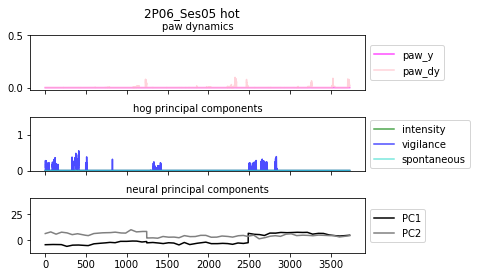

opto


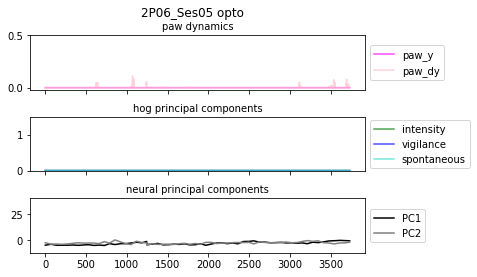

off-target


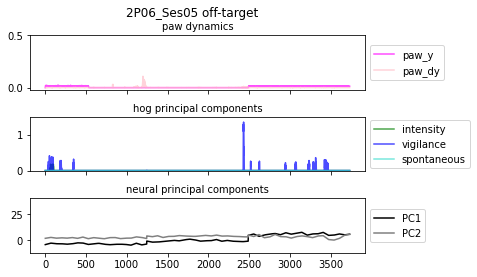

von frey


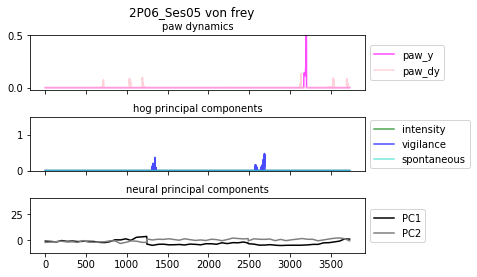

pin-prick


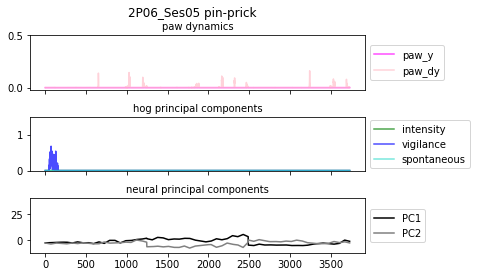

approach


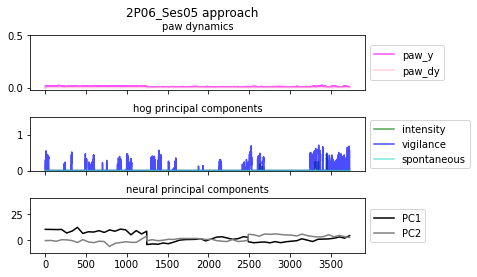

no stim


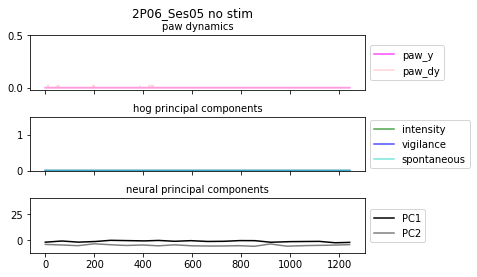

processing:  pca_data_up_2P05_Ses06.csv
2P05_Ses06
pca shape (29856, 320)
warm


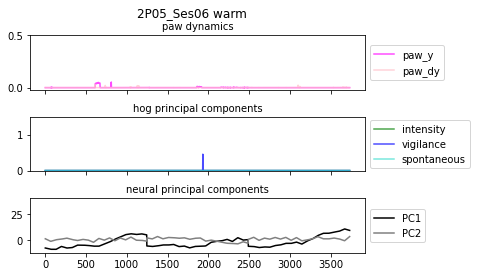

hot


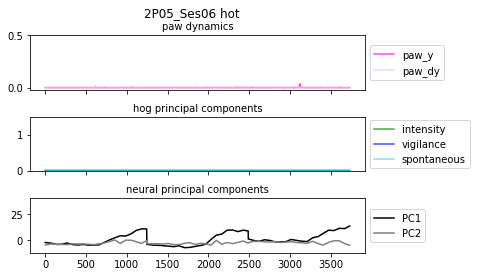

opto


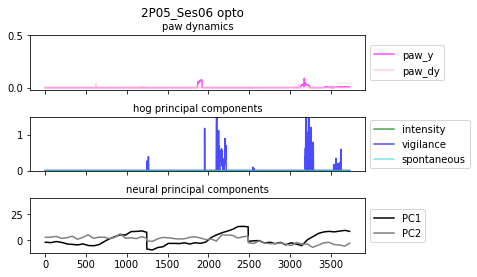

off-target


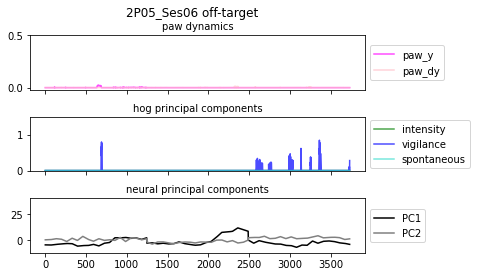

von frey


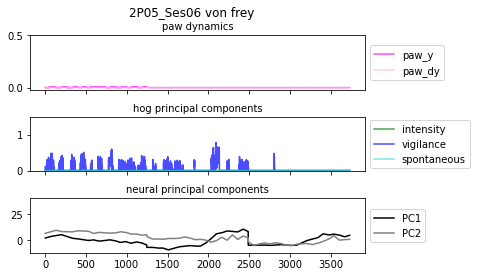

pin-prick


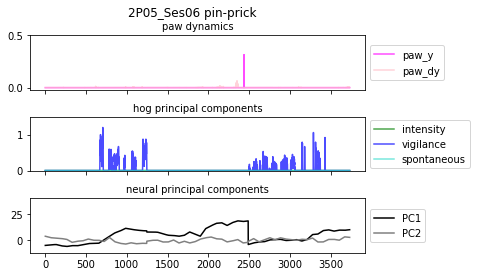

approach


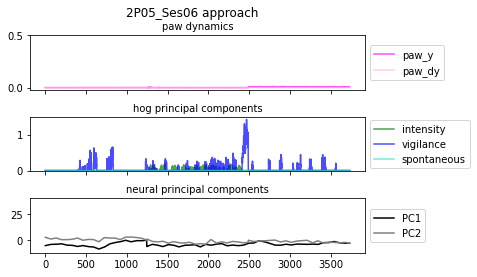

no stim


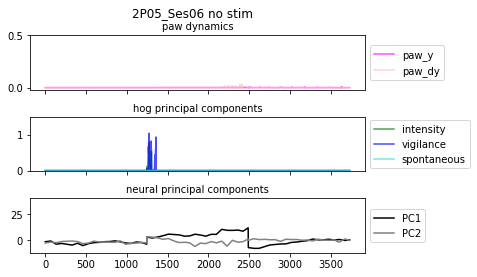

processing:  pca_data_up_2P06_Ses06.csv
2P06_Ses06
pca shape (29856, 348)
warm


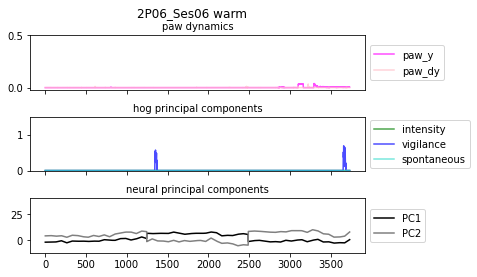

hot


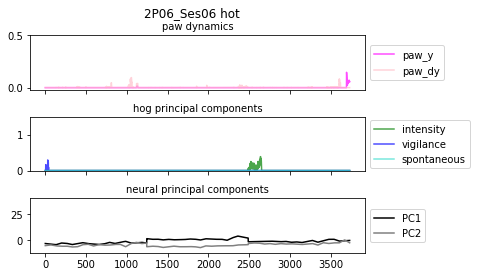

opto


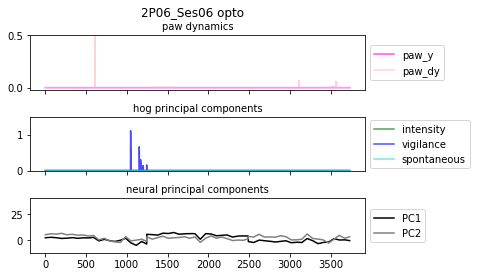

off-target


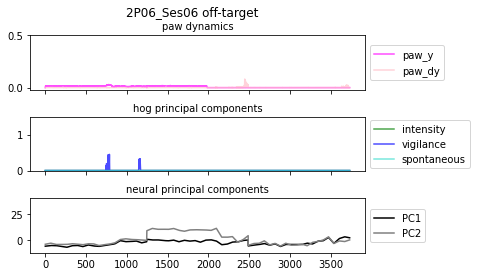

von frey


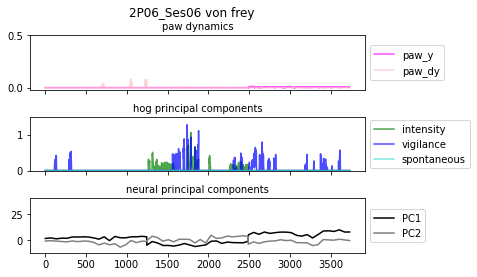

pin-prick


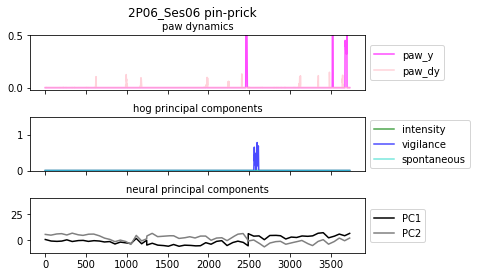

approach


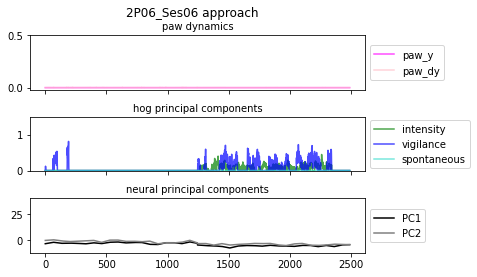

no stim


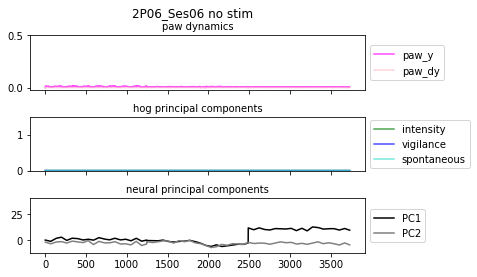

processing:  pca_data_up_2P05_Ses07.csv
2P05_Ses07
pca shape (27368, 377)
warm


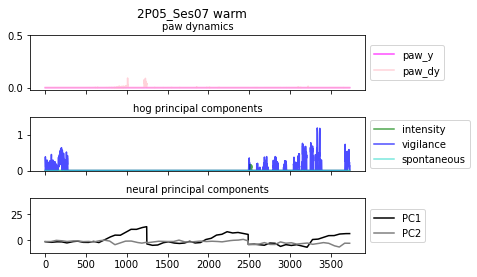

hot


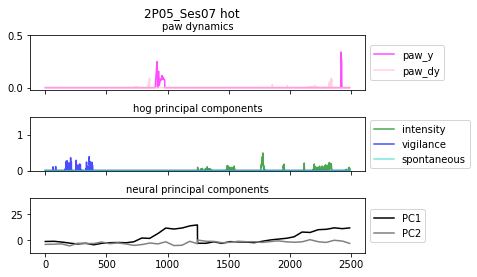

opto


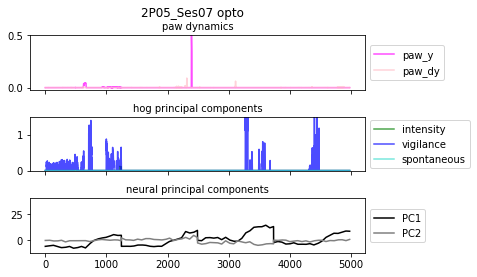

off-target


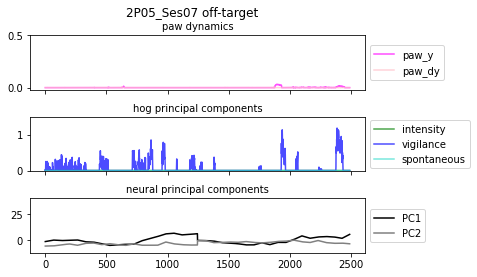

von frey


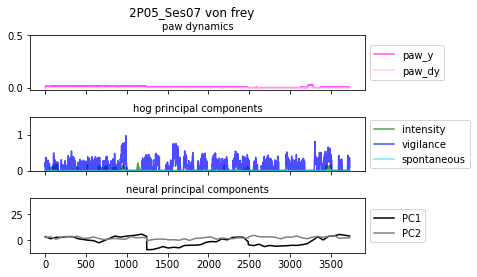

pin-prick


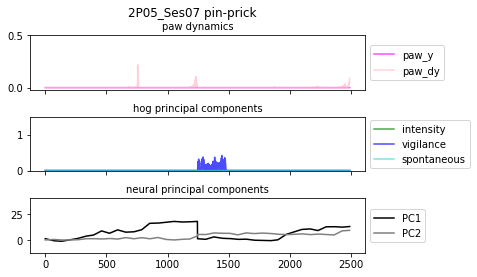

approach


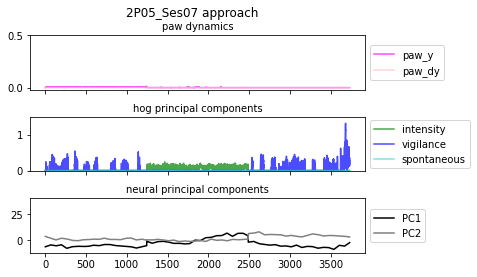

no stim


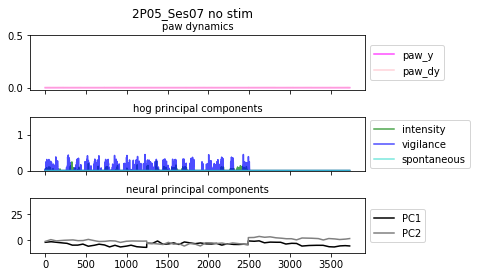

processing:  pca_data_up_2P06_Ses07.csv
2P06_Ses07
pca shape (28612, 461)
warm


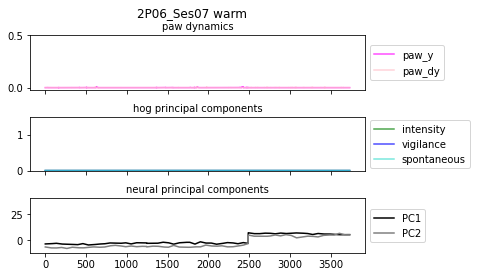

hot


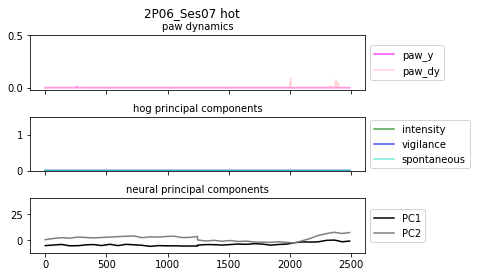

opto


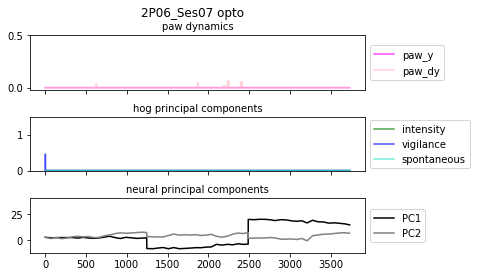

off-target


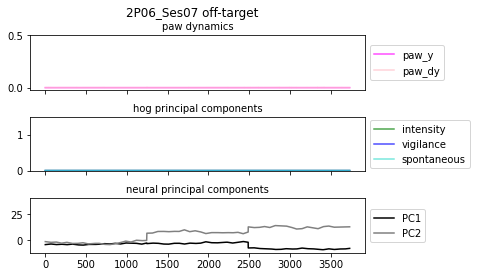

von frey


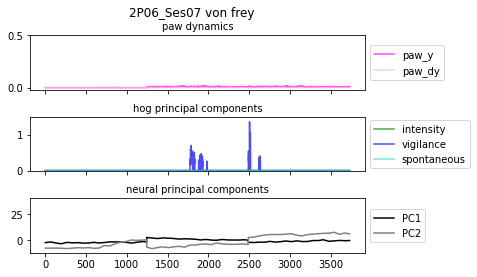

pin-prick


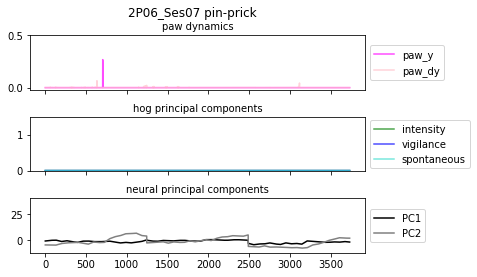

approach


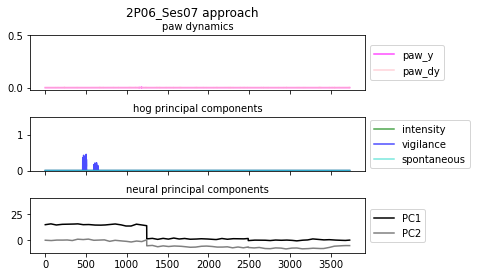

no stim


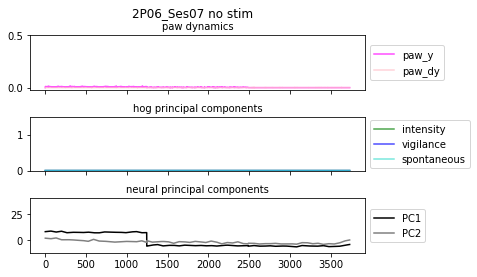

processing:  pca_data_up_2P07_Ses01.csv
2P07_Ses01
pca shape (28612, 305)
warm


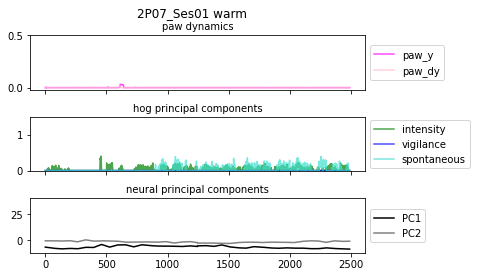

hot


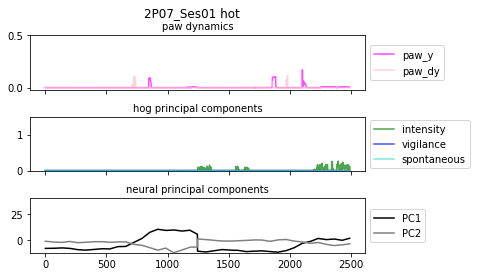

opto


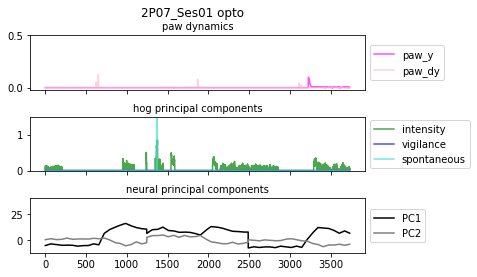

off-target


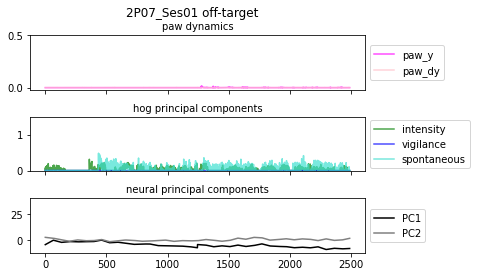

von frey


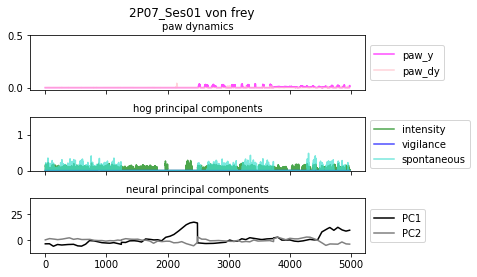

pin-prick


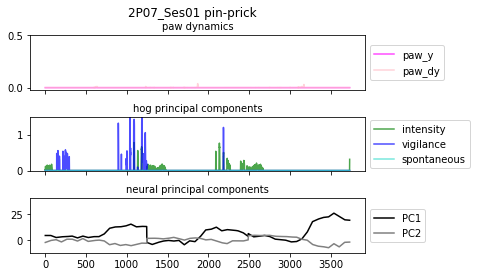

approach


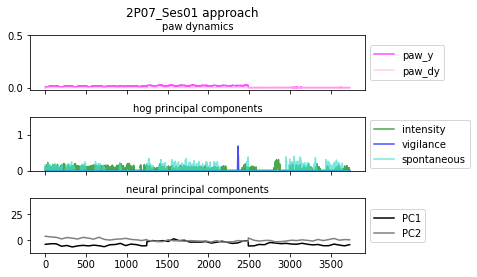

no stim


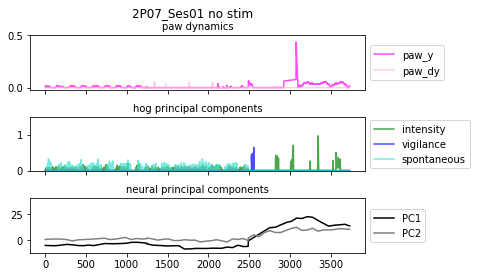

processing:  pca_data_up_2P08_Ses01.csv
2P08_Ses01
pca shape (31100, 205)
warm


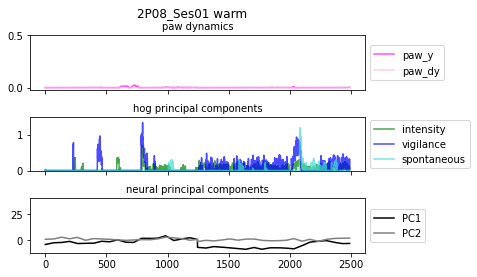

hot


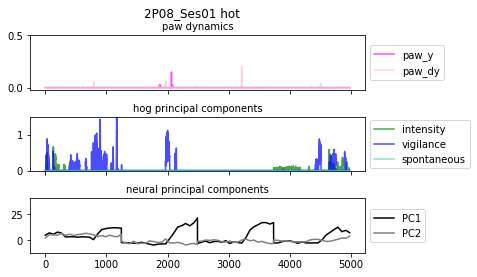

opto


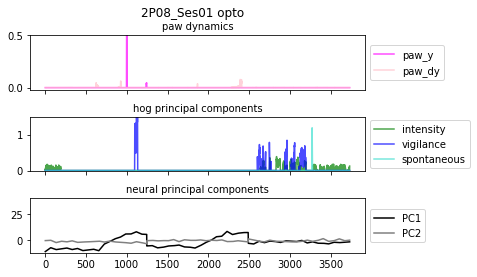

off-target


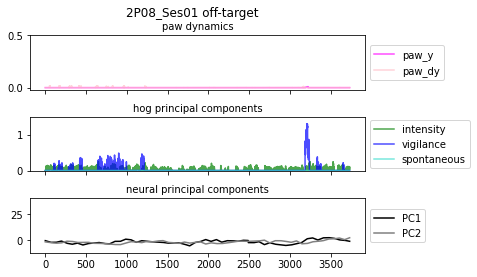

von frey


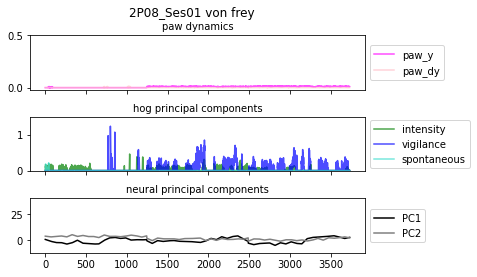

pin-prick


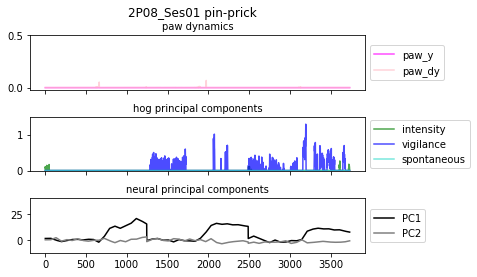

approach


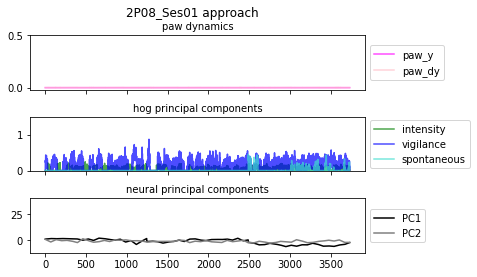

no stim


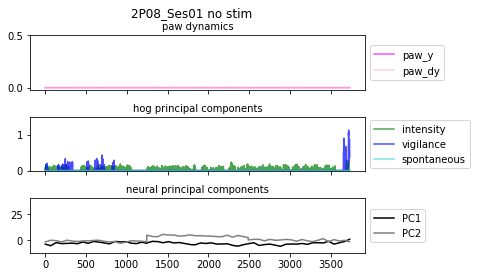

processing:  pca_data_up_2P07_Ses03.csv
2P07_Ses03
pca shape (27368, 441)
warm


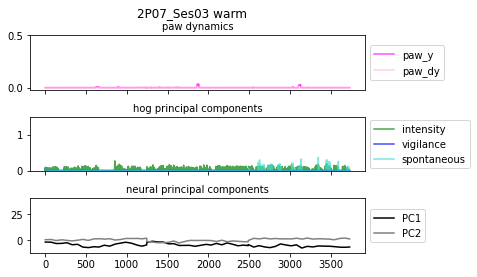

hot


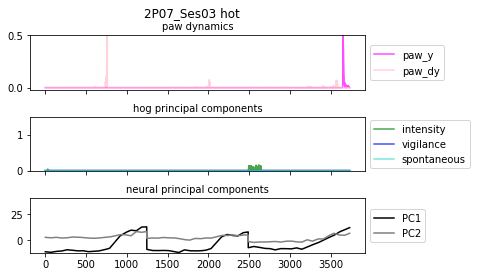

opto


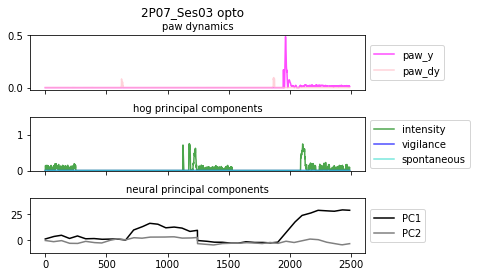

von frey


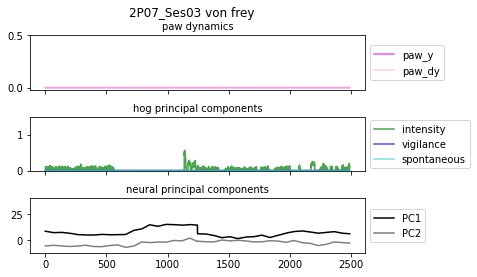

pin-prick


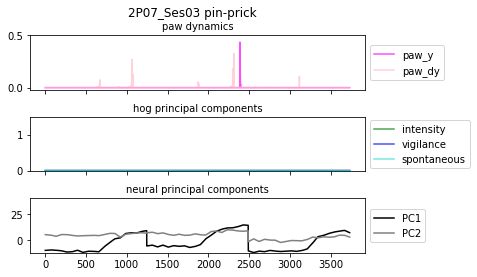

approach


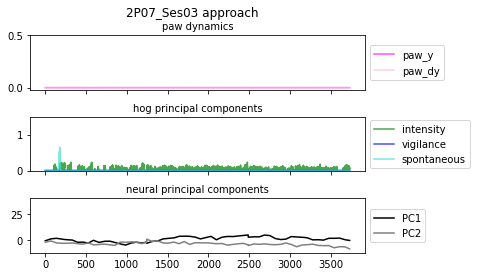

no stim


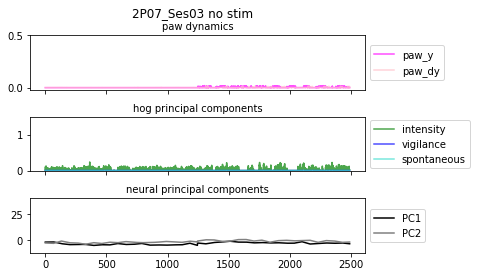

processing:  pca_data_up_2P08_Ses02.csv
2P08_Ses02
pca shape (28612, 348)
warm


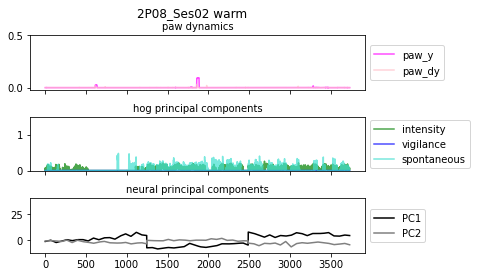

hot


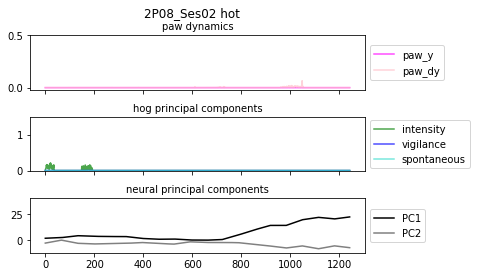

opto


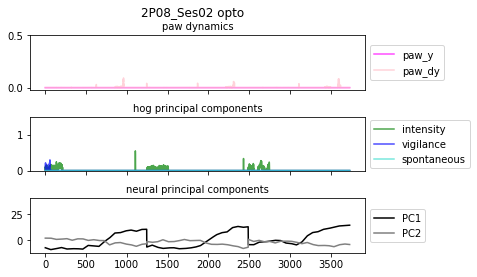

off-target


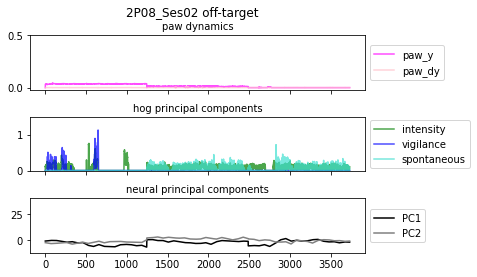

von frey


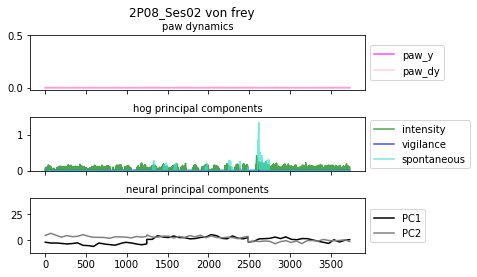

pin-prick


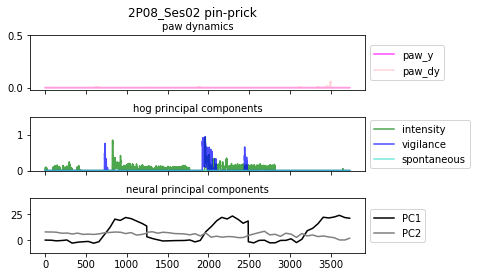

approach


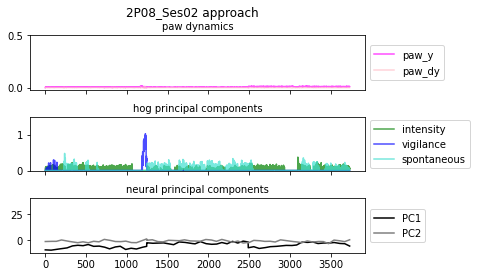

no stim


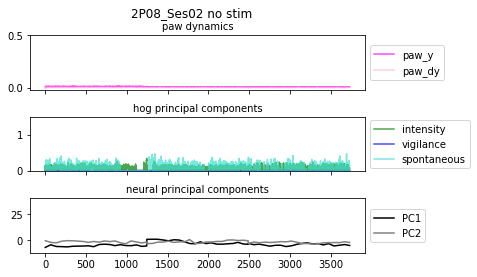

processing:  pca_data_up_2P07_Ses04.csv
2P07_Ses04
pca shape (29856, 481)
warm


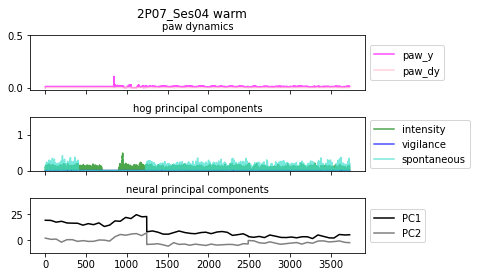

hot


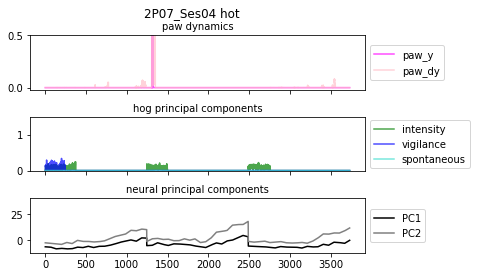

opto


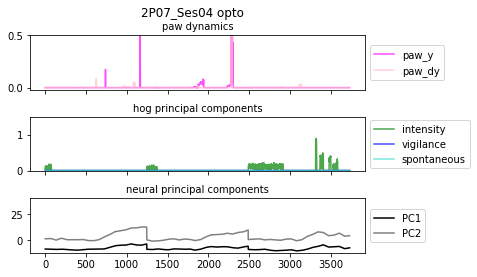

off-target


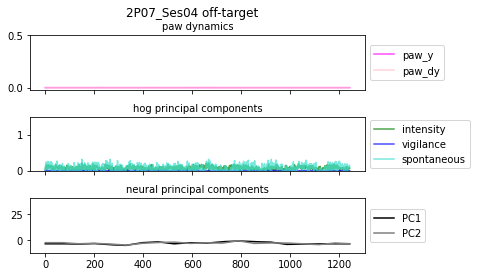

von frey


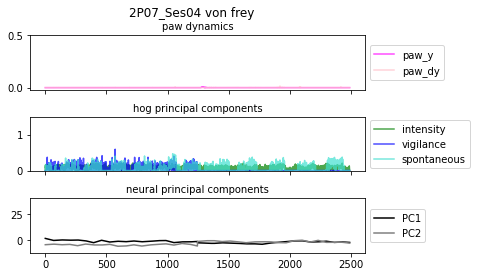

pin-prick


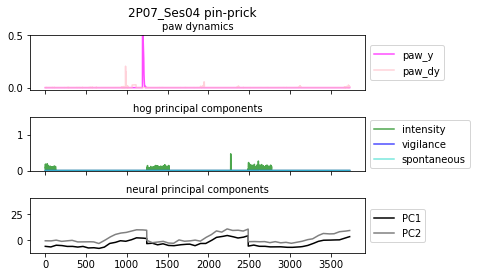

approach


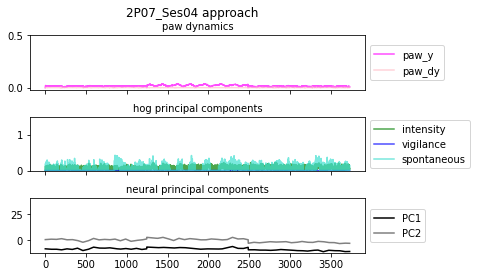

no stim


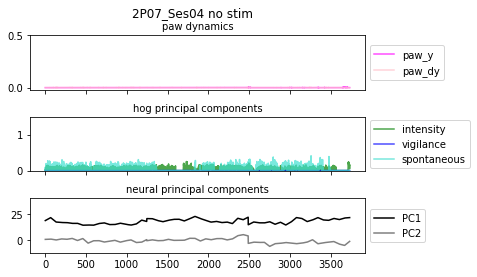

processing:  pca_data_up_2P07_Ses05.csv
2P07_Ses05
pca shape (29856, 460)
warm


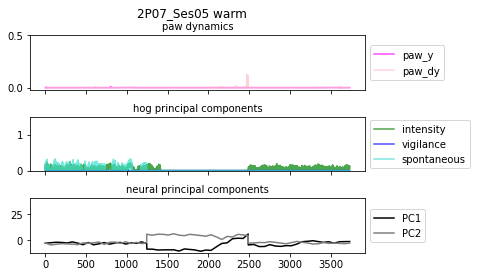

hot


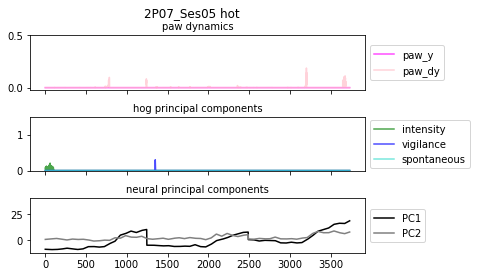

opto


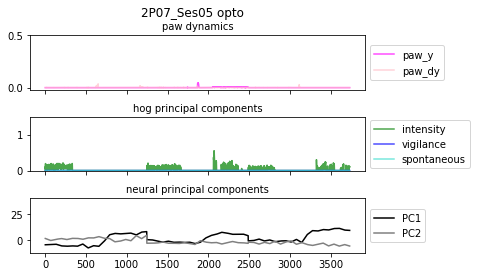

off-target


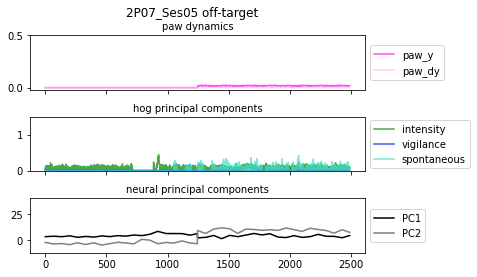

von frey


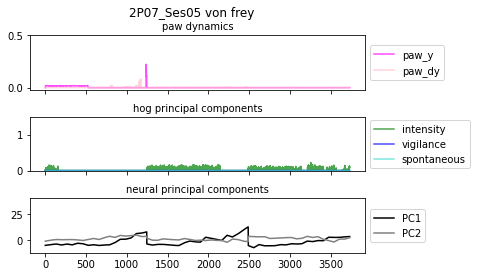

pin-prick


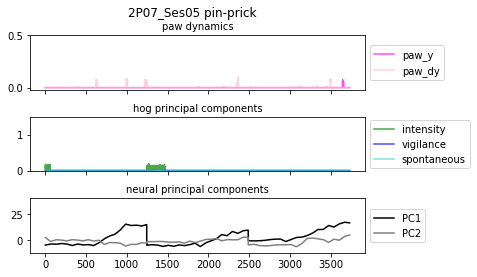

approach


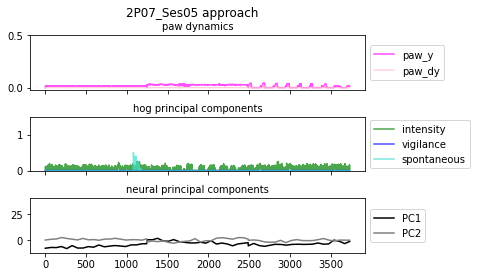

no stim


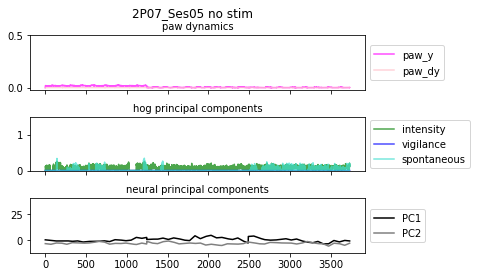

processing:  pca_data_up_2P08_Ses04.csv
2P08_Ses04
pca shape (29856, 209)
warm


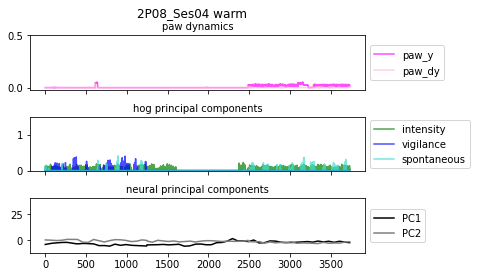

hot


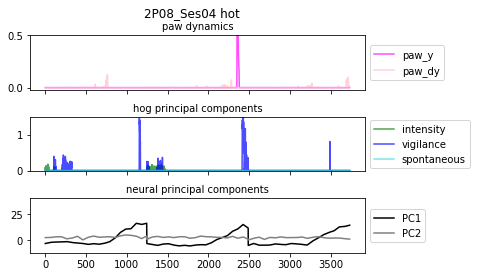

opto


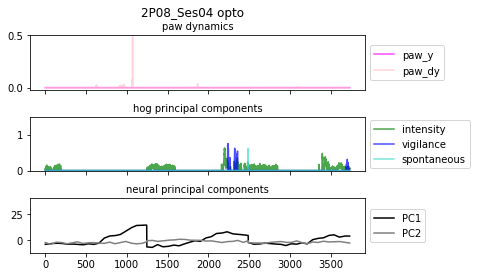

off-target


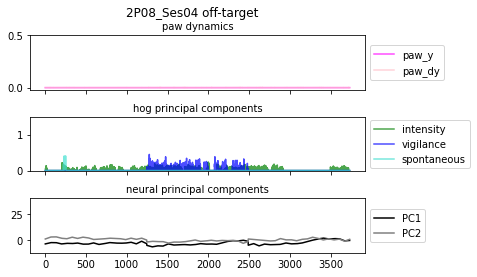

von frey


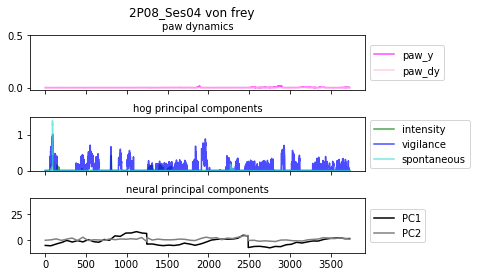

pin-prick


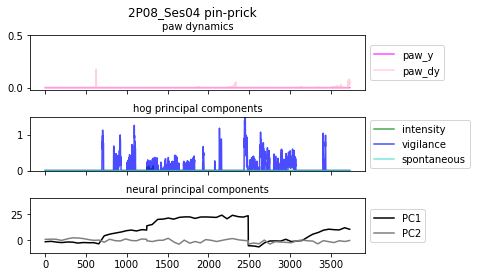

approach


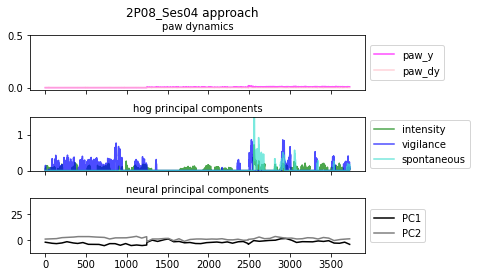

no stim


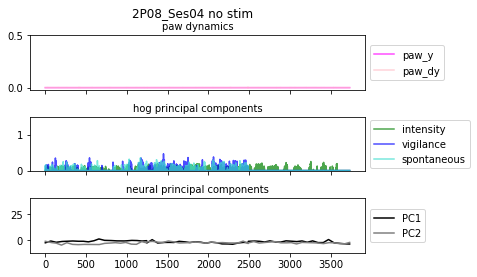

processing:  pca_data_up_2P07_Ses06.csv
2P07_Ses06
pca shape (27368, 407)
warm


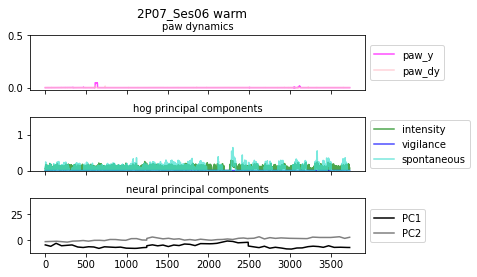

hot


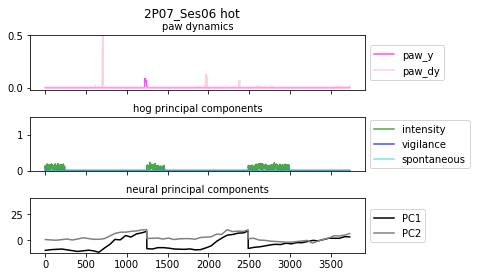

opto


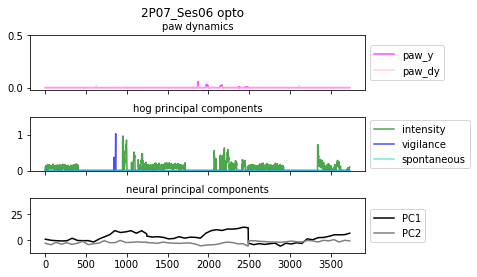

off-target


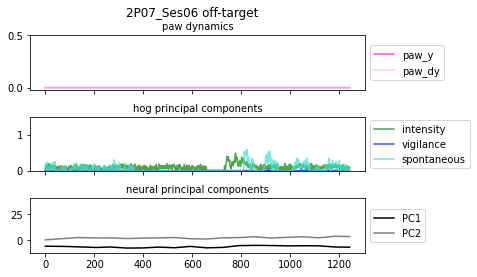

von frey


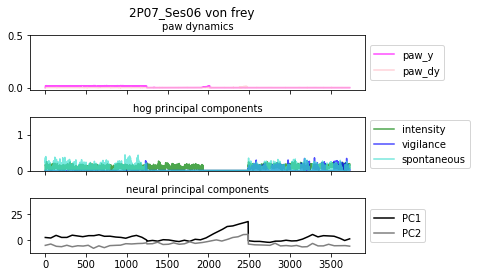

pin-prick


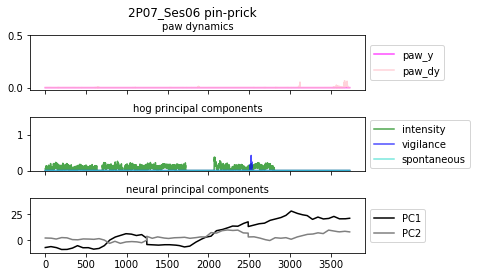

approach


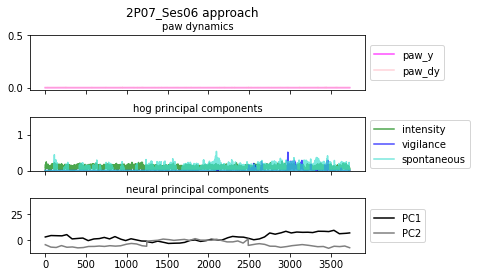

no stim


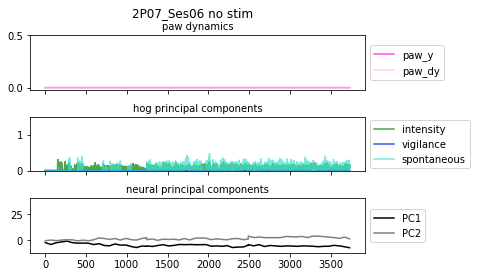

processing:  pca_data_up_2P08_Ses05.csv
2P08_Ses05
pca shape (28612, 382)
warm


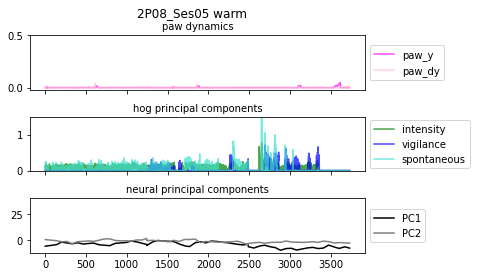

hot


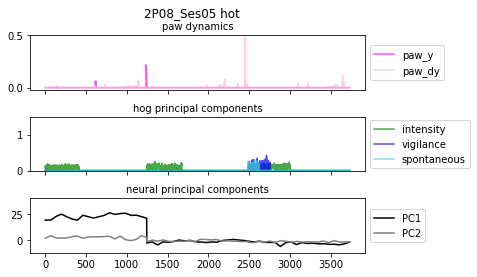

opto


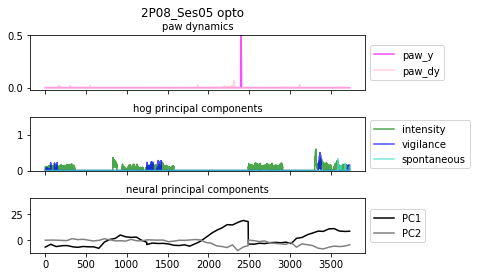

off-target


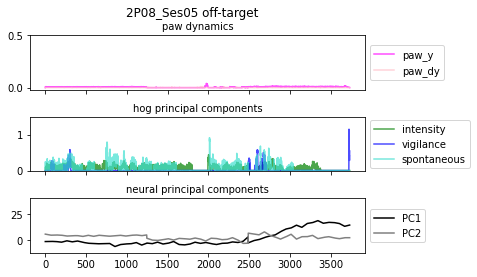

von frey


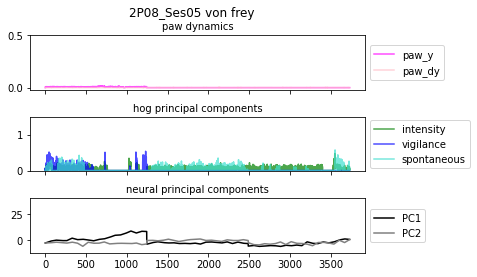

pin-prick


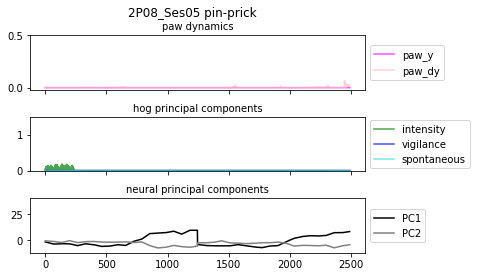

approach


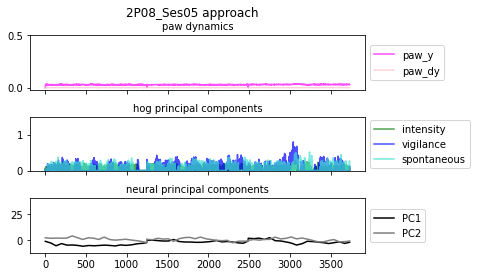

no stim


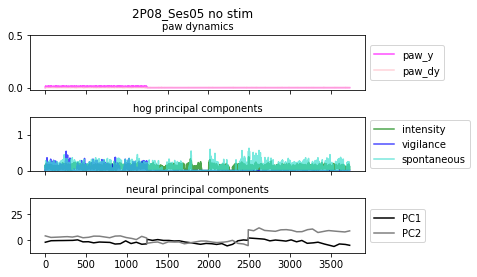

processing:  pca_data_up_2P07_Ses07.csv
2P07_Ses07
pca shape (29856, 318)
warm


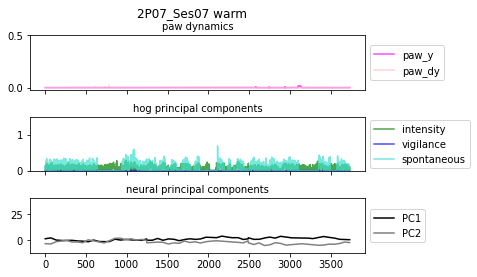

hot


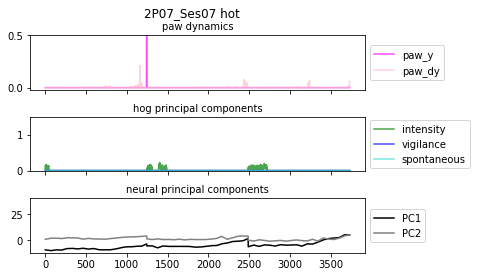

opto


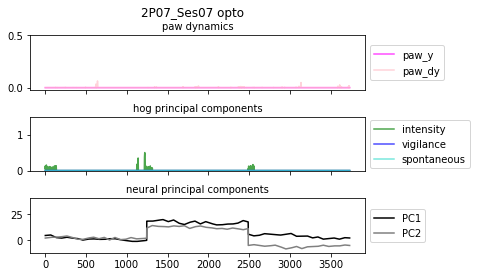

off-target


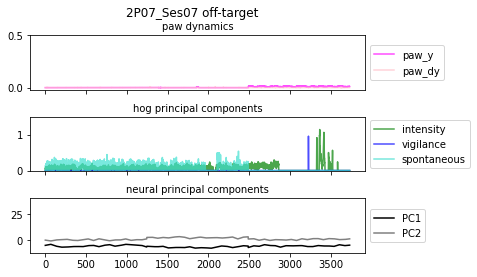

von frey


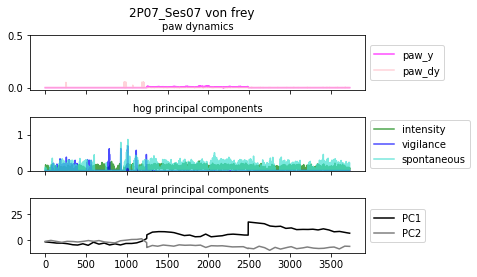

pin-prick


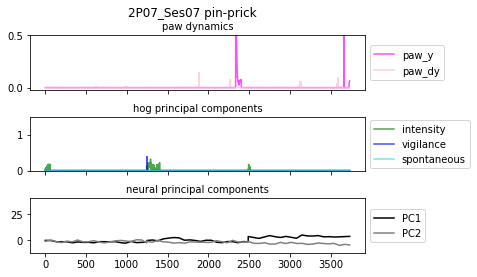

approach


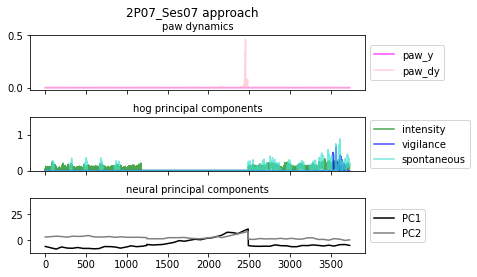

no stim


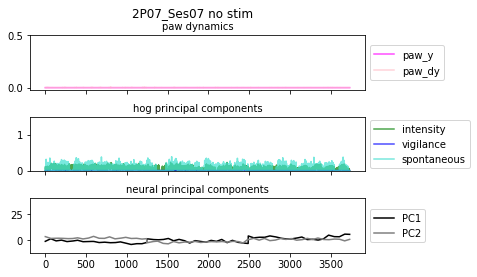

processing:  pca_data_up_2P08_Ses06.csv
2P08_Ses06
pca shape (28612, 269)
warm


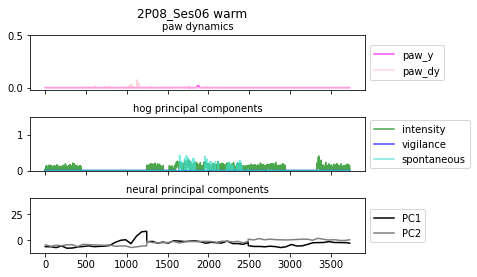

hot


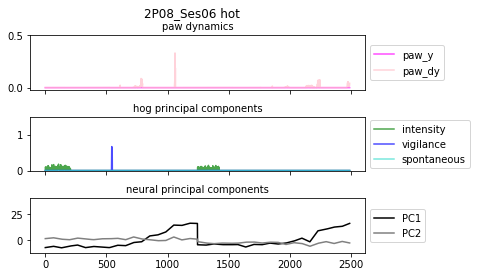

opto


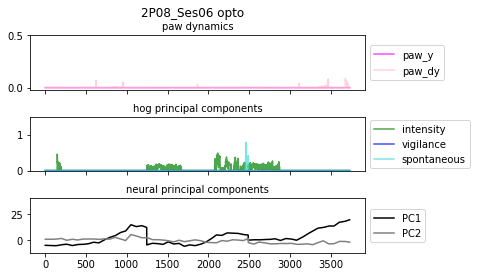

off-target


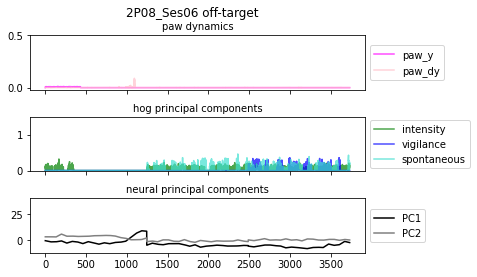

von frey


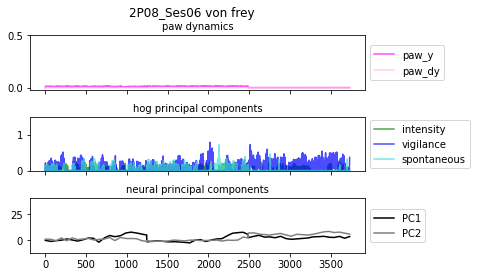

pin-prick


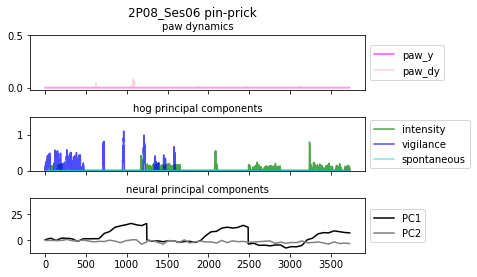

approach


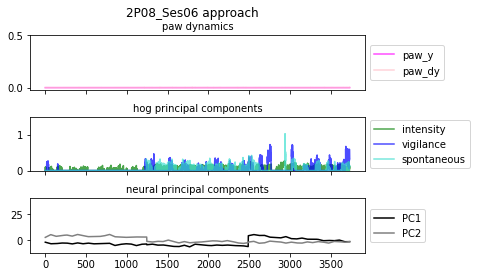

no stim


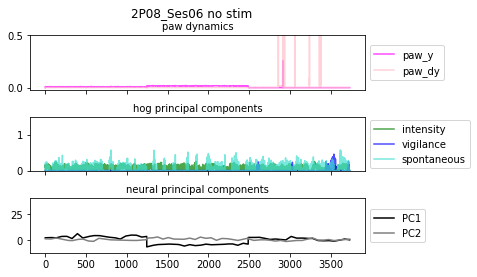

processing:  pca_data_up_2P07_CFA.csv
2P07_CFA
pca shape (28612, 305)
warm


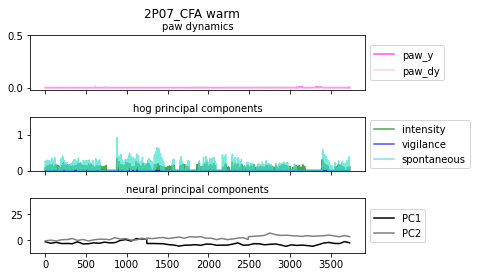

hot


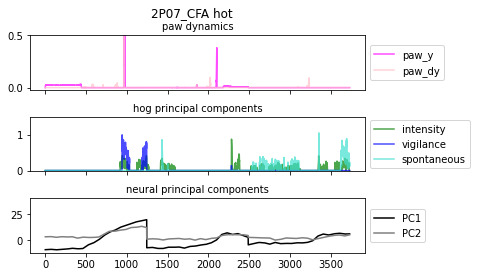

opto


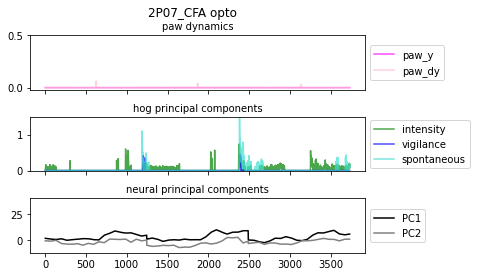

off-target


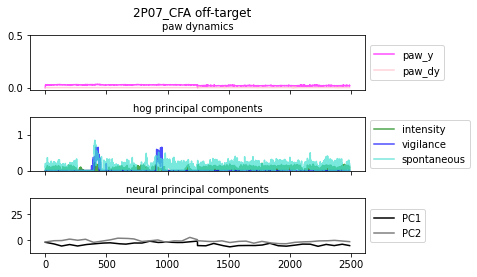

von frey


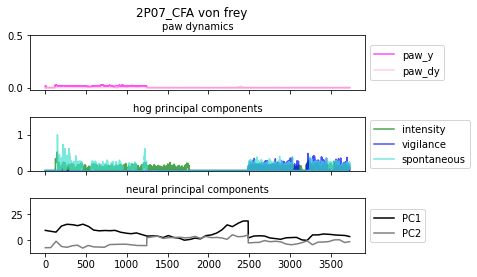

pin-prick


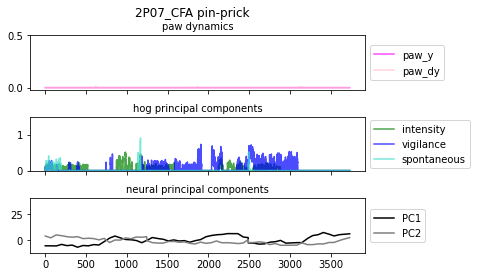

approach


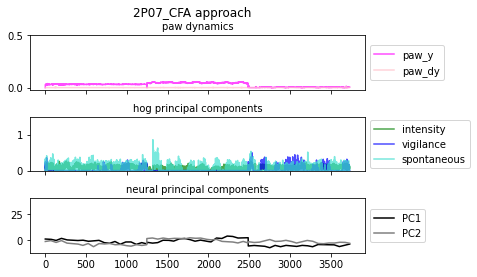

no stim


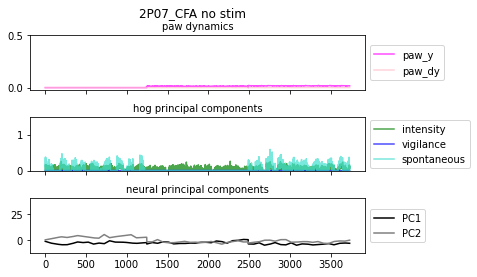

processing:  pca_data_up_2P09_Ses01.csv
2P09_Ses01
pca shape (27368, 441)
warm


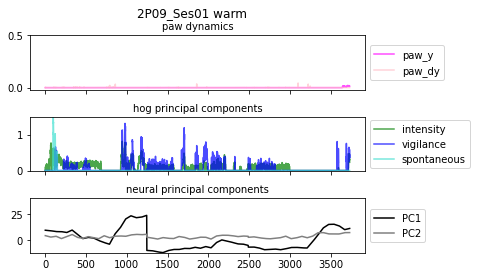

hot


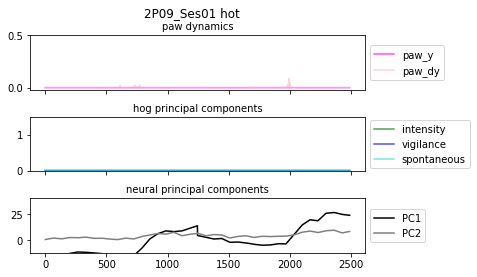

opto


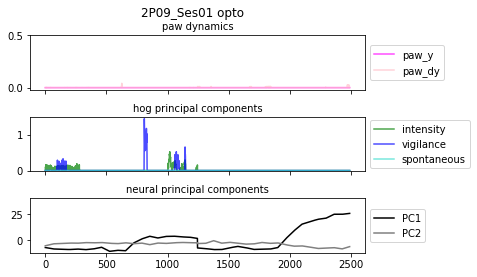

off-target


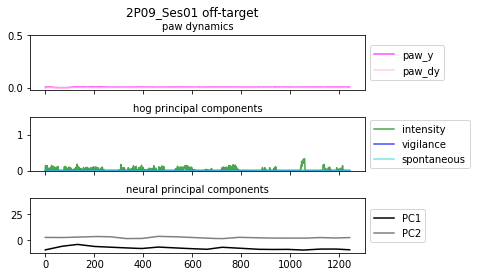

von frey


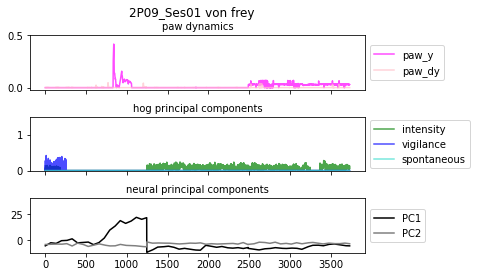

pin-prick


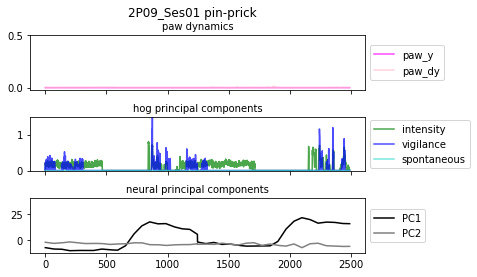

approach


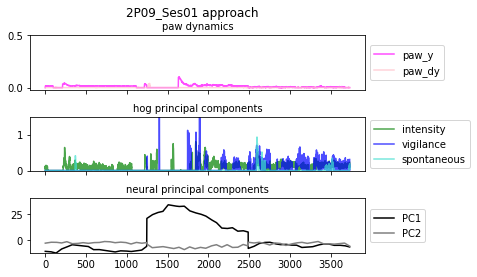

no stim


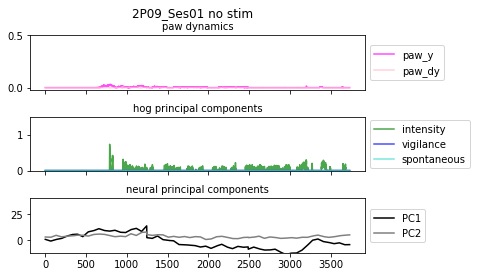

processing:  pca_data_up_2P08_CFA.csv
2P08_CFA
pca shape (29856, 343)
warm


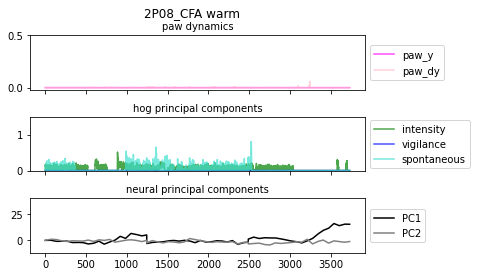

hot


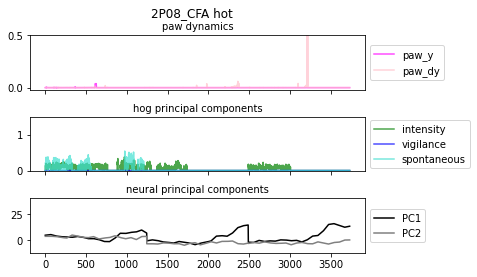

opto


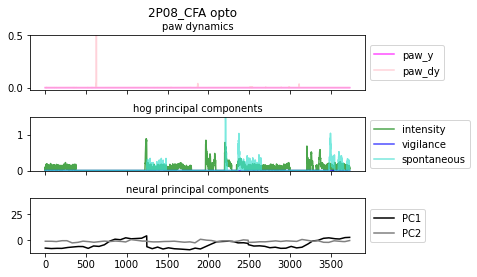

off-target


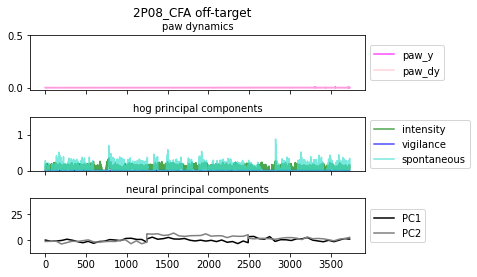

von frey


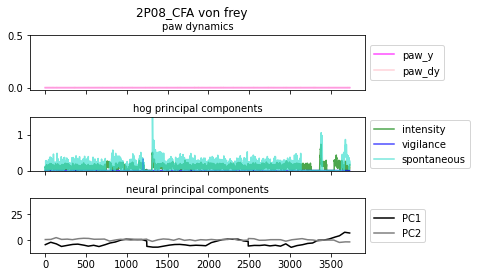

pin-prick


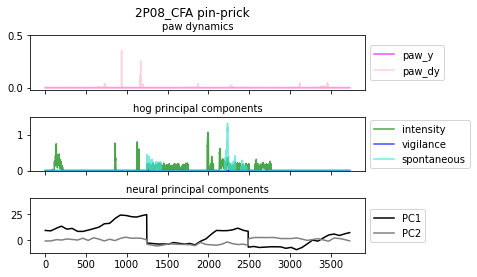

approach


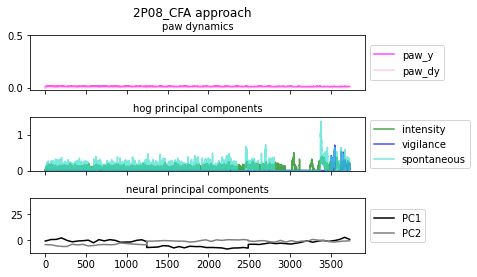

no stim


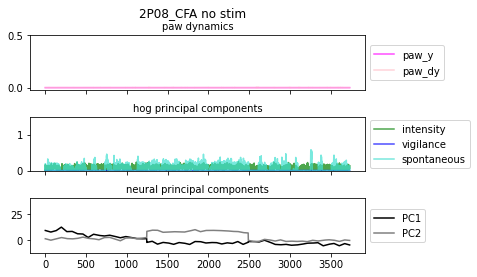

processing:  pca_data_up_2P11_Ses01.csv
2P11_Ses01
pca shape (29856, 458)
warm


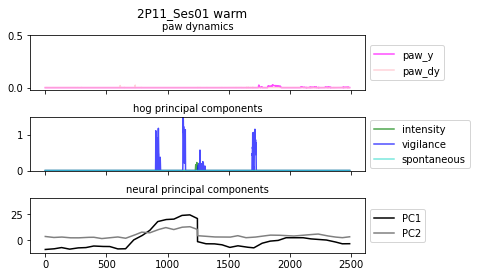

hot


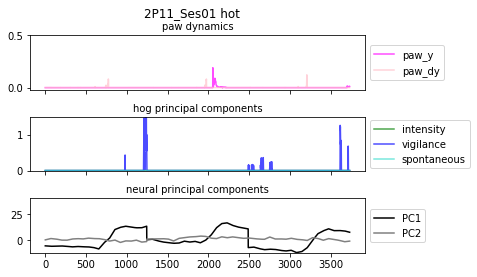

opto


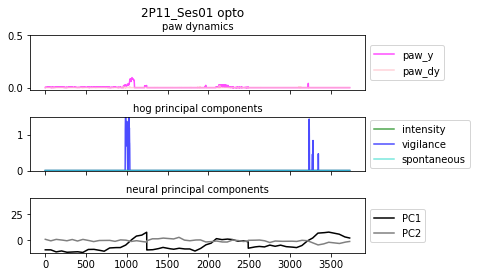

off-target


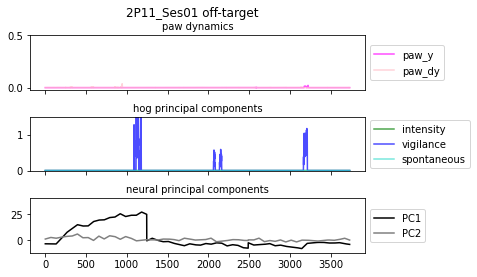

von frey


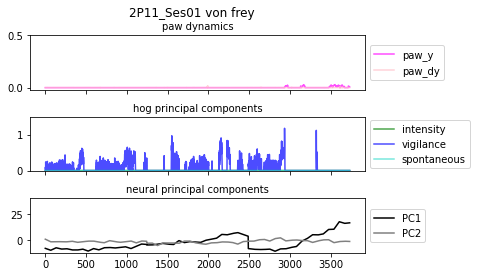

pin-prick


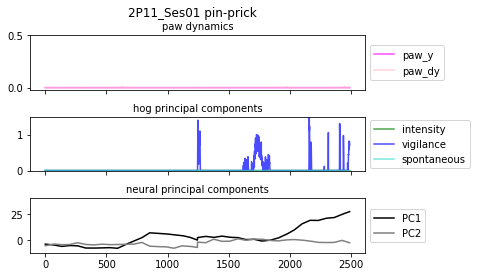

approach


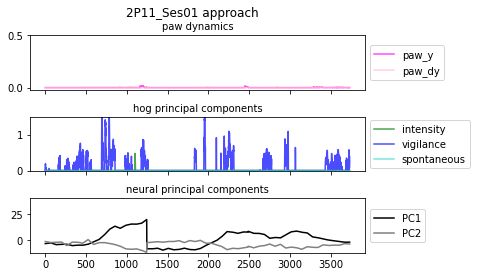

no stim


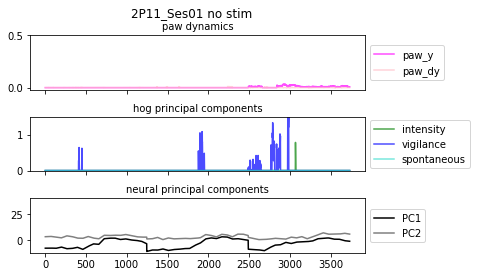

processing:  pca_data_up_2P10_Ses01.csv
2P10_Ses01
pca shape (31100, 501)
warm


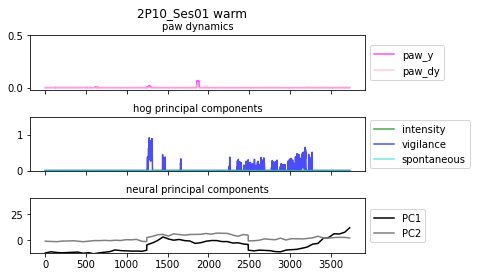

hot


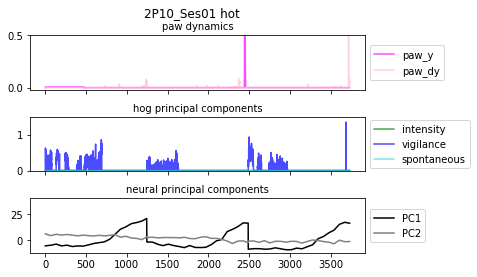

opto


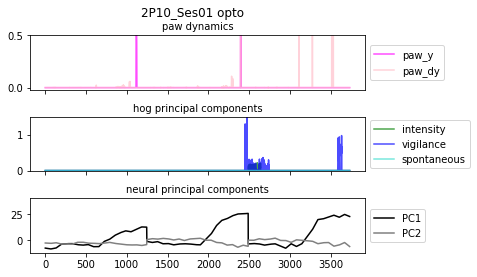

off-target


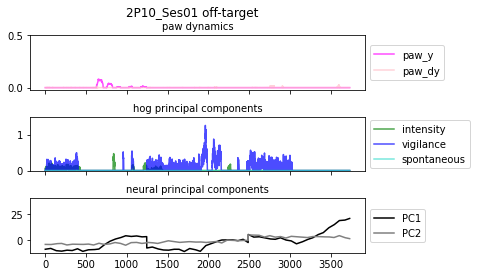

von frey


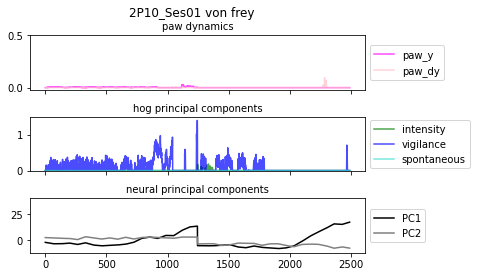

pin-prick


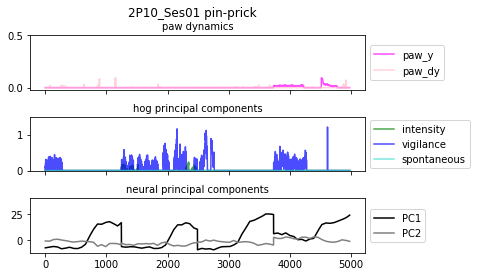

approach


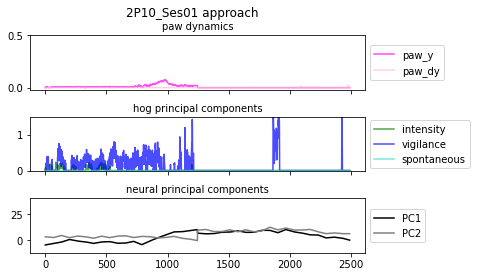

no stim


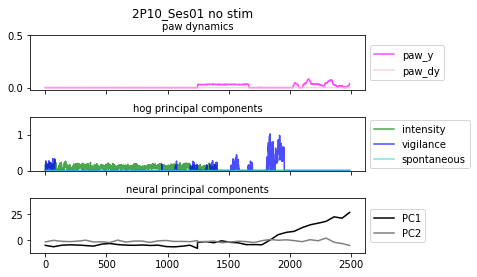

processing:  pca_data_up_2P09_Ses02.csv
2P09_Ses02
pca shape (31100, 501)
warm


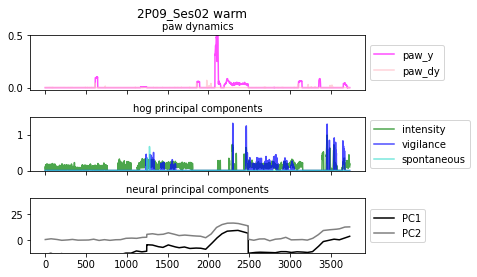

hot


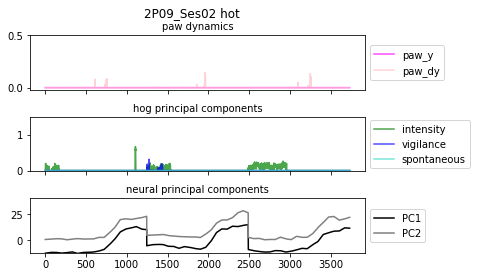

opto


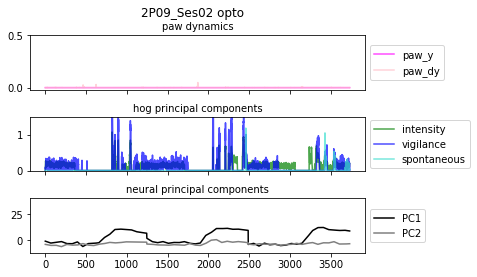

off-target


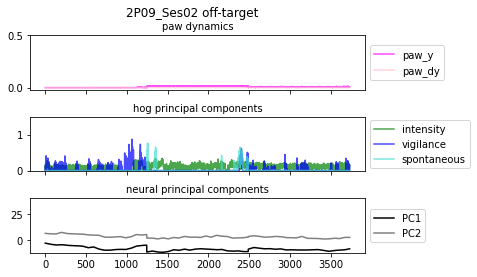

von frey


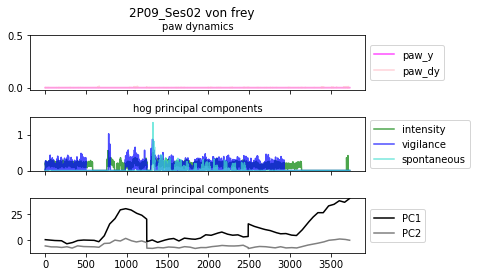

pin-prick


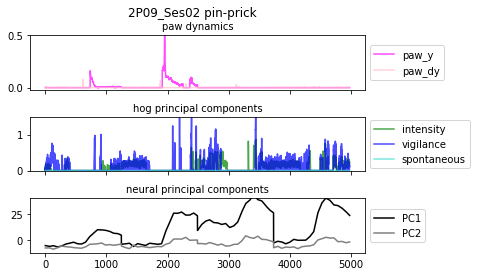

approach


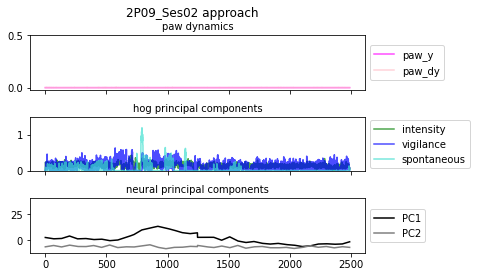

no stim


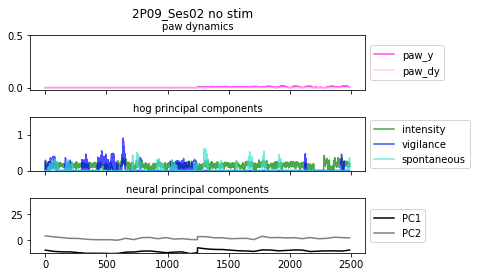

processing:  pca_data_up_2P10_Ses02.csv
2P10_Ses02
pca shape (28612, 461)
warm


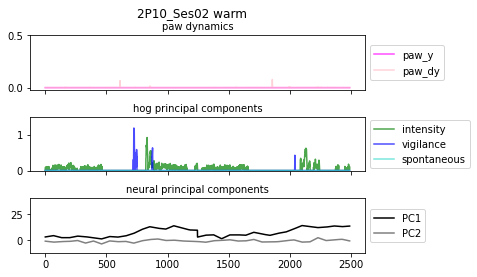

hot


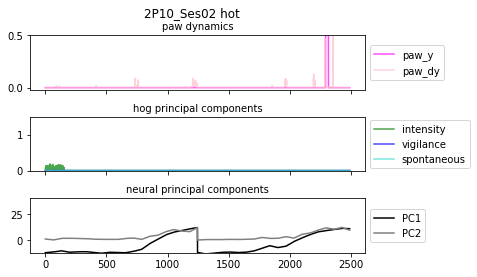

opto


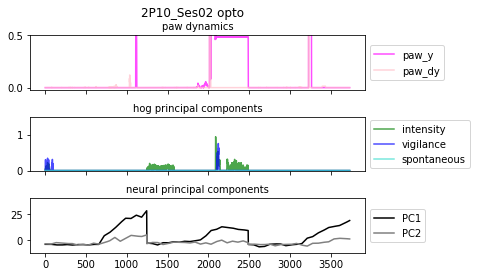

off-target


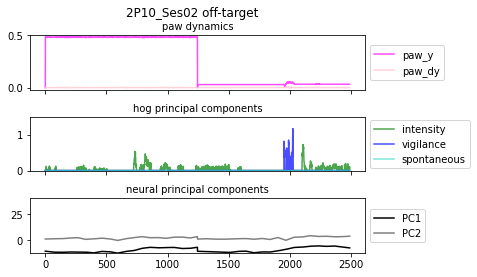

von frey


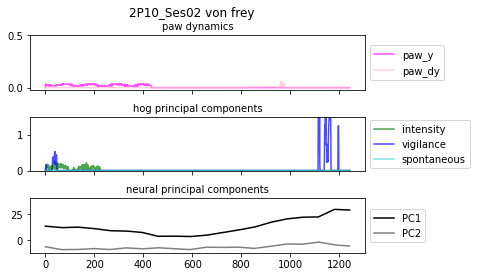

pin-prick


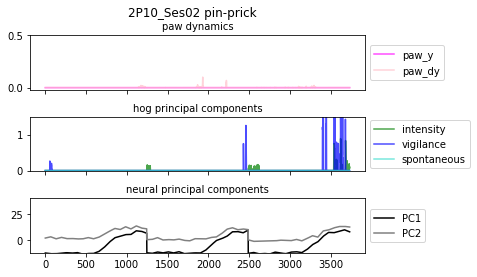

approach


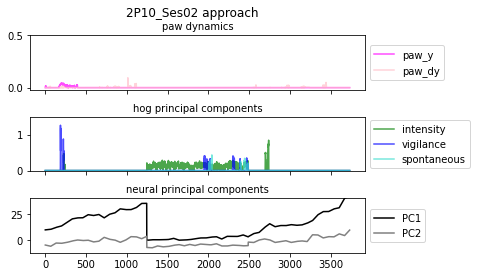

no stim


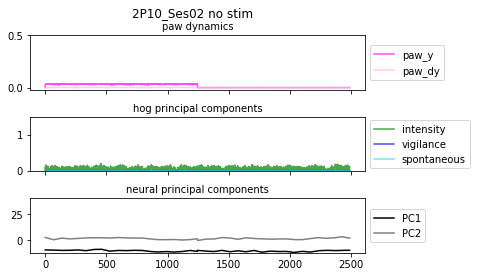

processing:  pca_data_up_2P09_Ses04.csv
2P09_Ses04
pca shape (29856, 481)
warm


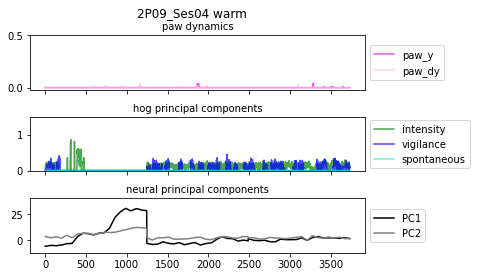

hot


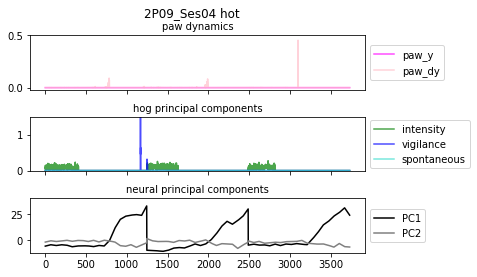

opto


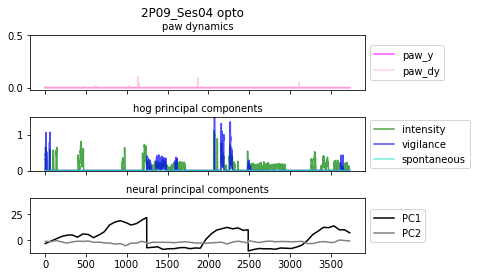

off-target


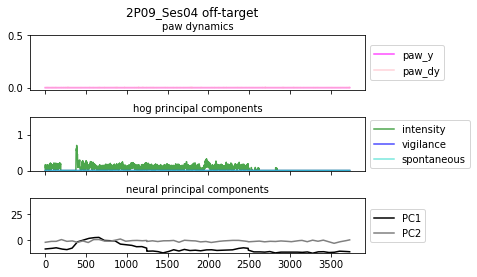

von frey


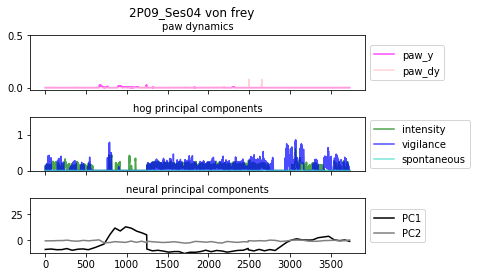

pin-prick


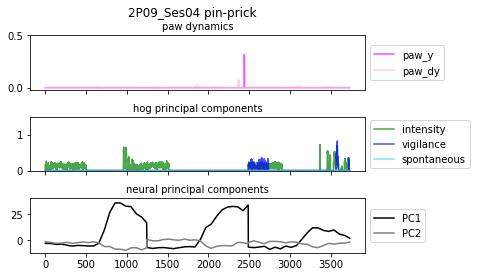

approach


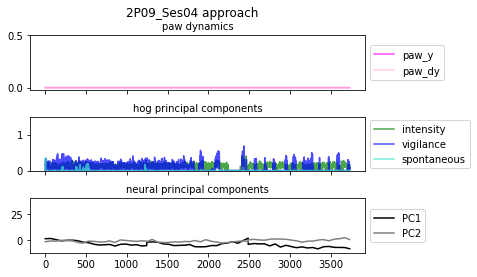

no stim


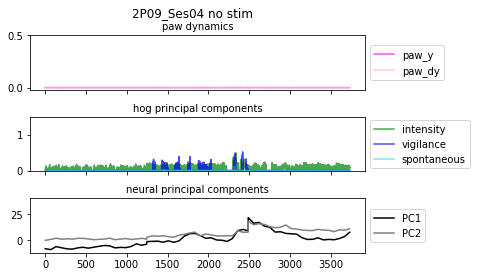

processing:  pca_data_up_2P11_Ses04.csv
2P11_Ses04
pca shape (29856, 481)
warm


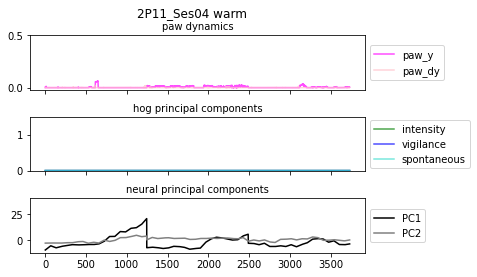

hot


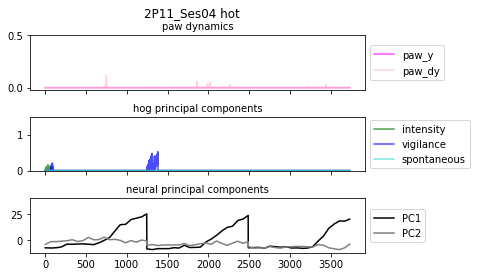

opto


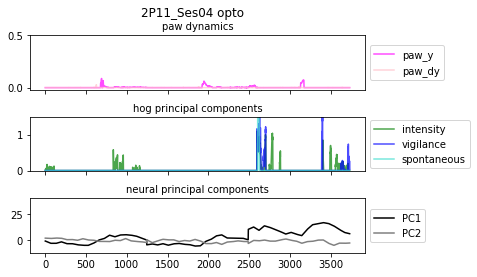

off-target


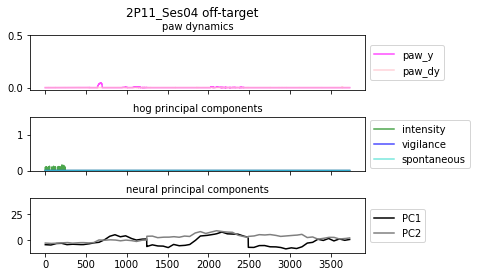

von frey


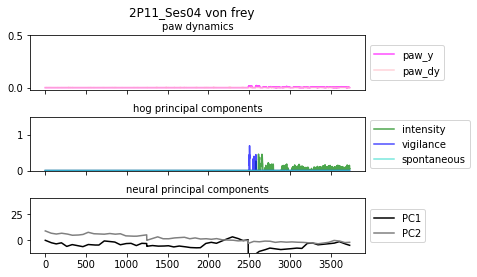

pin-prick


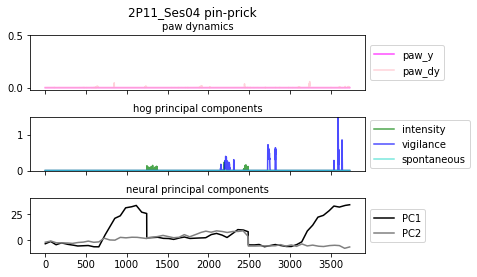

approach


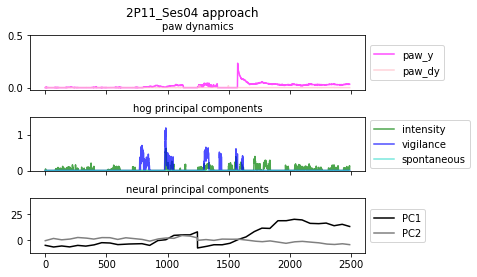

no stim


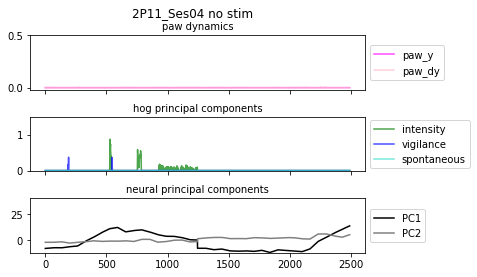

processing:  pca_data_up_2P11_Ses05.csv
2P11_Ses05
pca shape (24880, 401)
warm


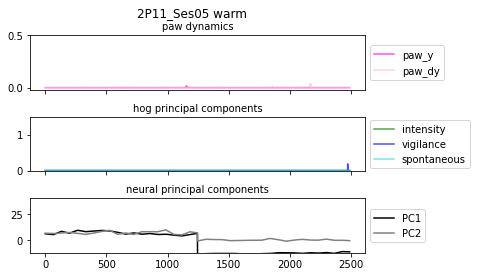

hot


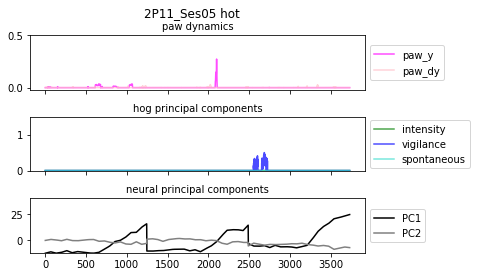

opto


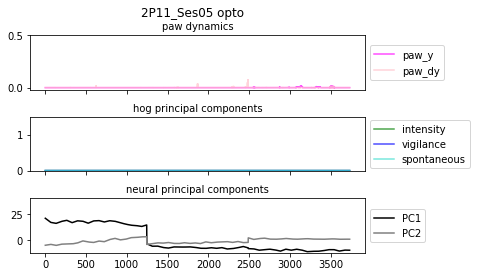

off-target


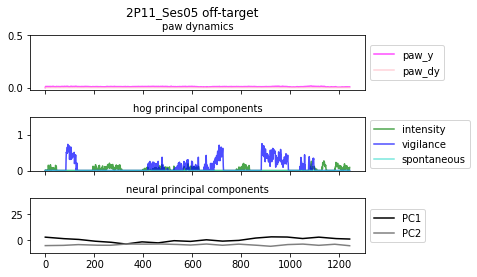

von frey


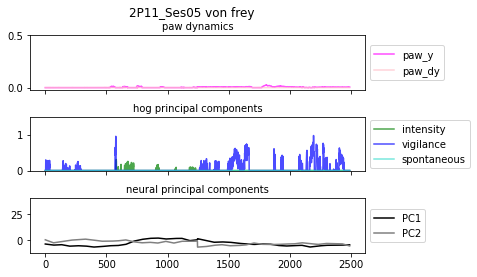

pin-prick


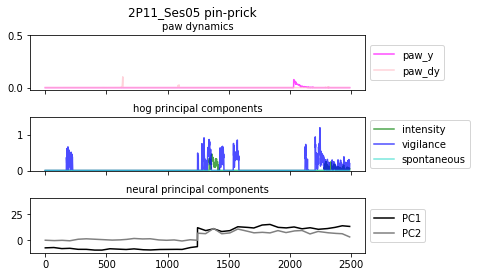

approach


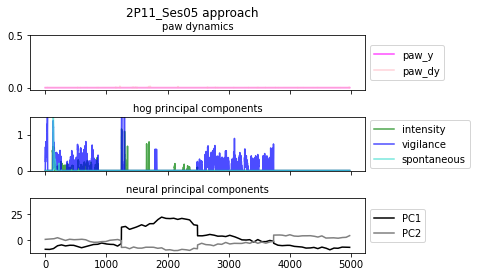

no stim


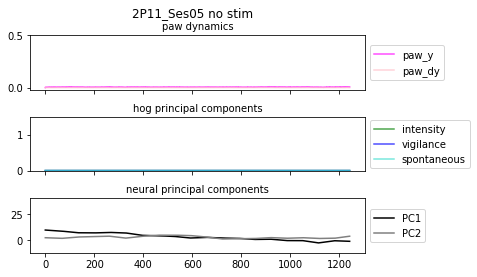

processing:  pca_data_up_2P10_CFA.csv
2P10_CFA
pca shape (29856, 481)
warm


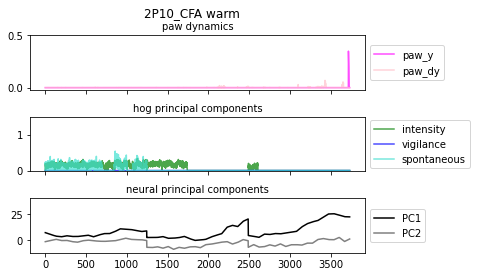

hot


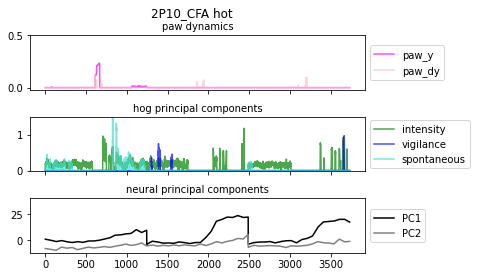

opto


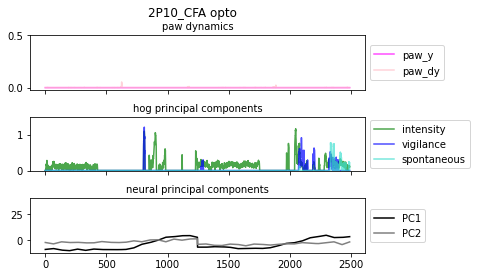

off-target


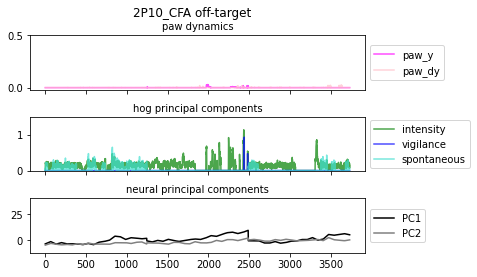

von frey


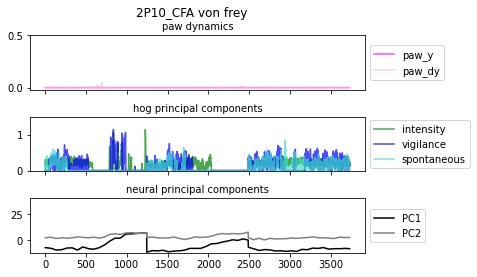

pin-prick


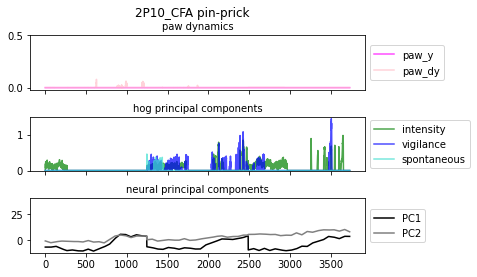

approach


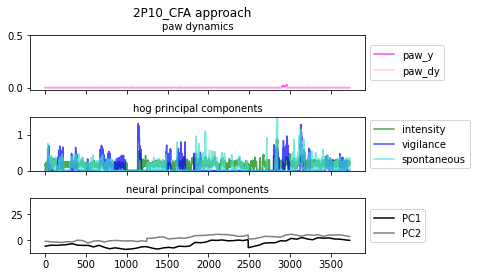

no stim


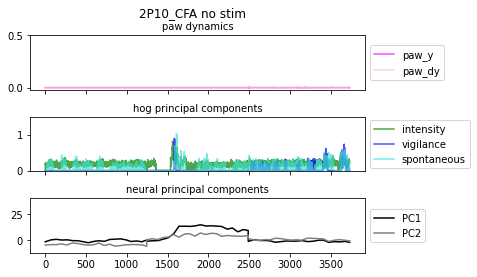

processing:  pca_data_up_2P09_CFA.csv
2P09_CFA
pca shape (27368, 425)
warm


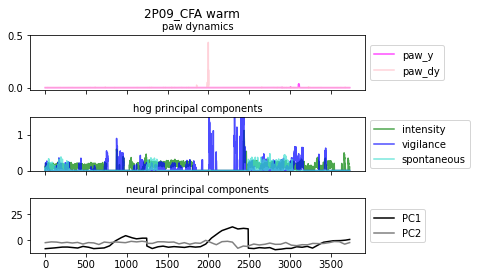

hot


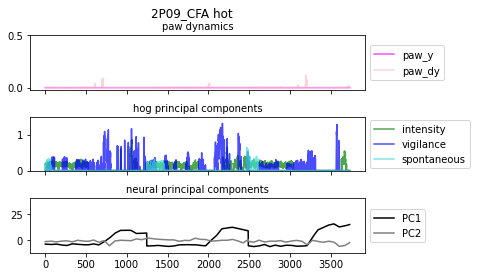

opto


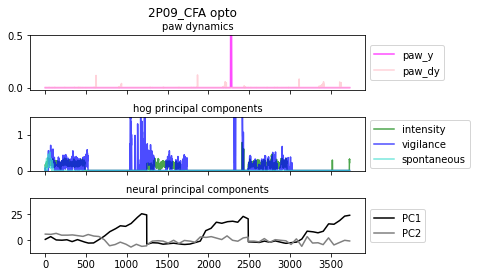

off-target


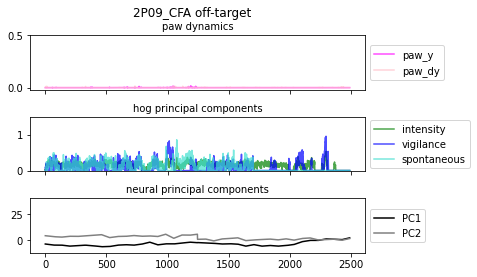

von frey


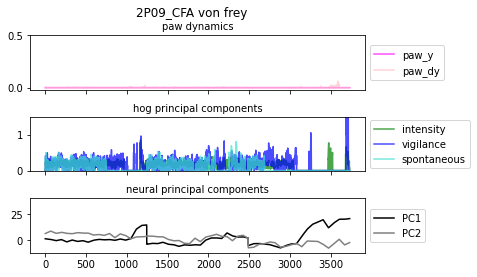

pin-prick


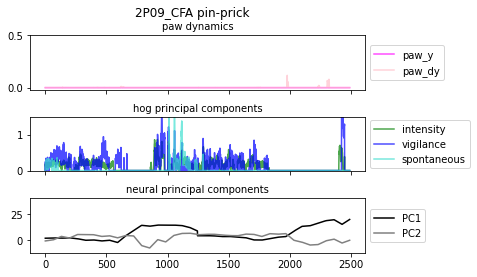

approach


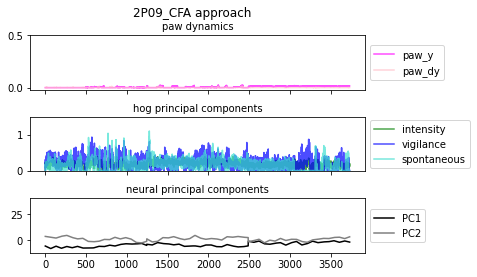

no stim


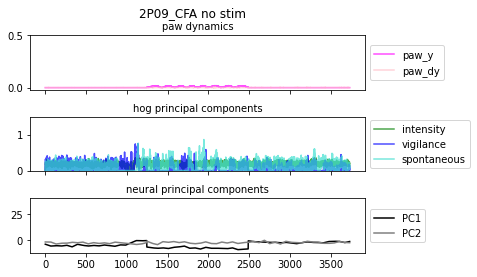

processing:  pca_data_up_2P11_Ses02.csv
2P11_Ses02
pca shape (28612, 461)
warm


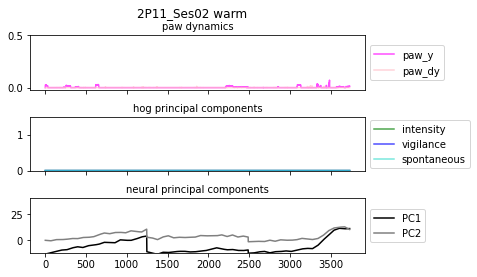

hot


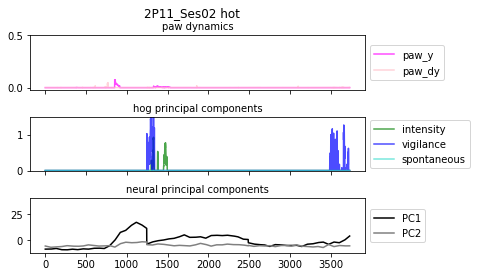

opto


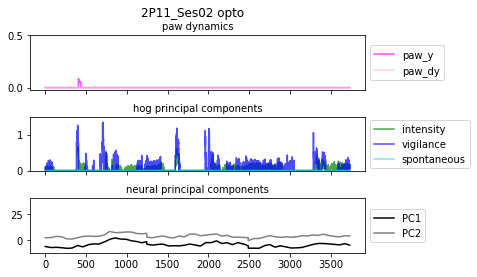

off-target


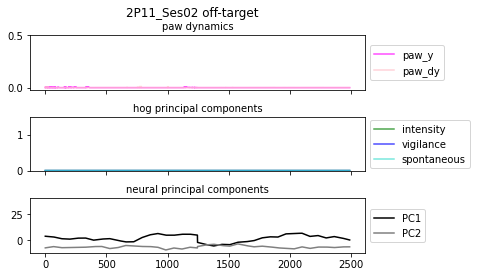

von frey


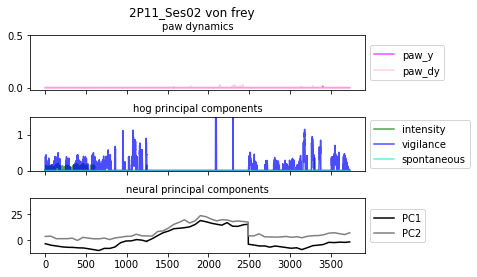

pin-prick


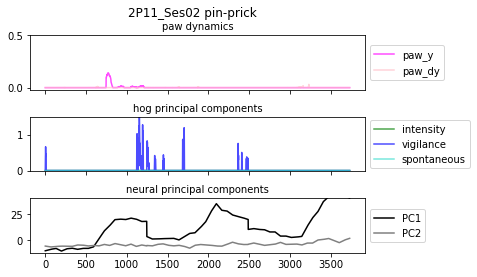

approach


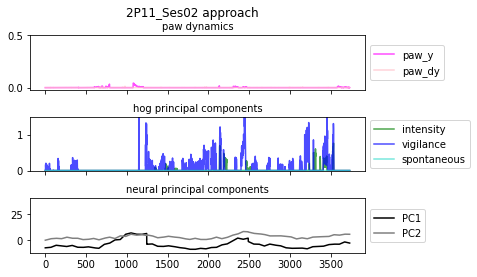

no stim


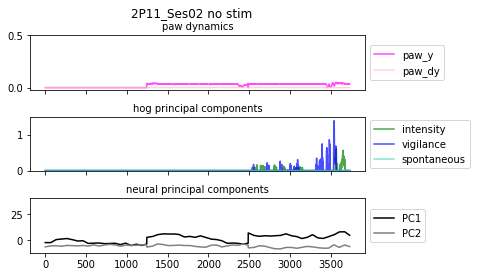

processing:  pca_data_up_2P09_Ses03.csv
2P09_Ses03
pca shape (29856, 347)
warm


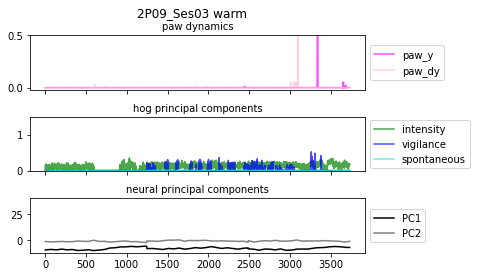

hot


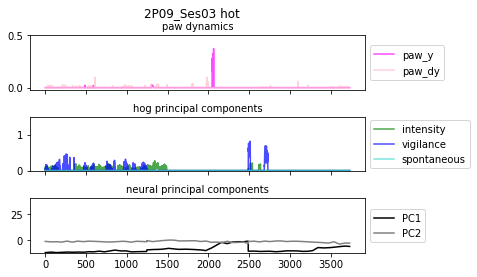

opto


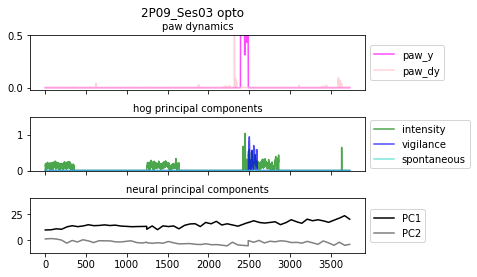

off-target


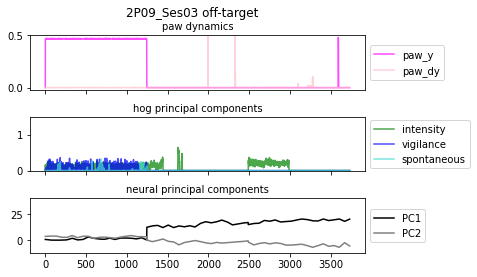

von frey


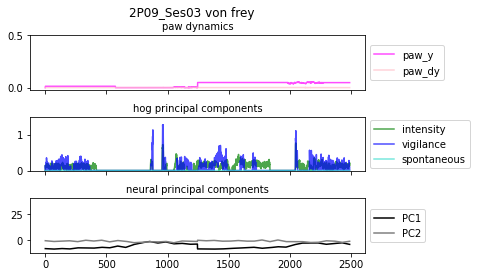

pin-prick


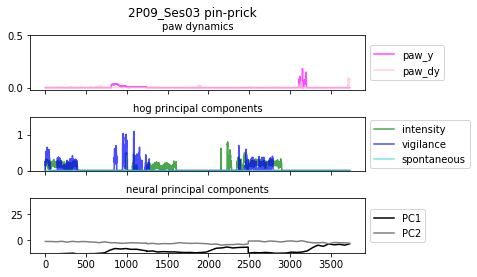

approach


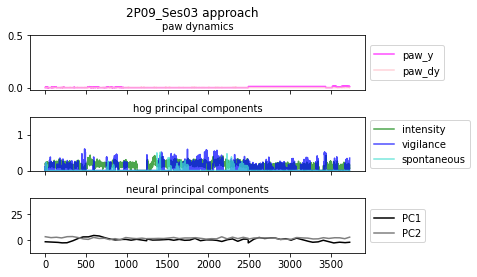

no stim


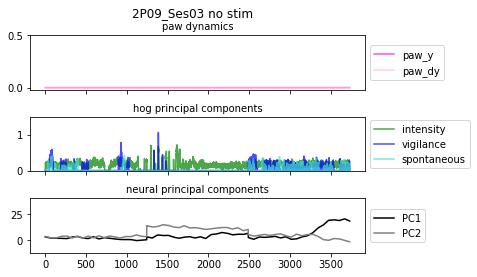

processing:  pca_data_up_2P10_Ses03.csv
2P10_Ses03
pca shape (28612, 461)
warm


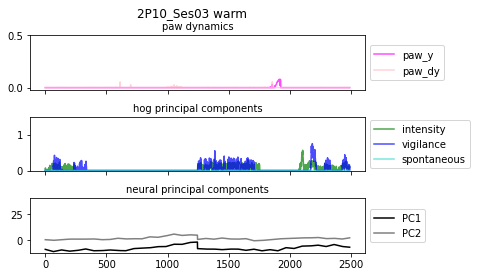

hot


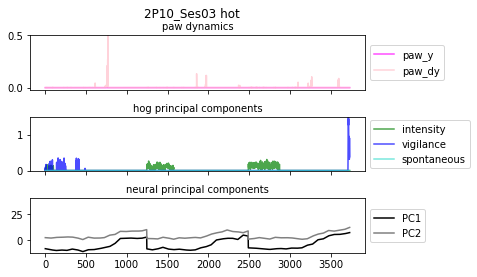

opto


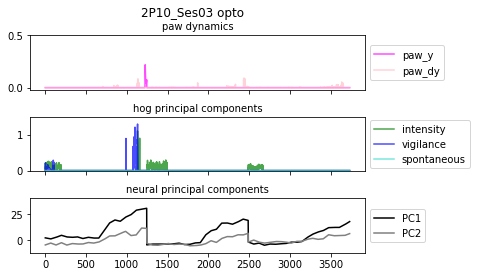

off-target


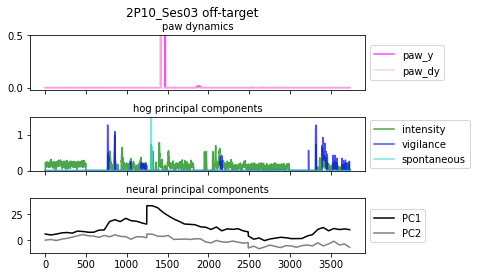

von frey


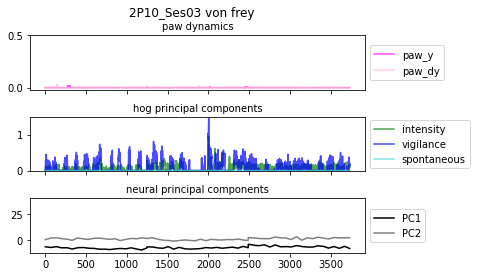

pin-prick


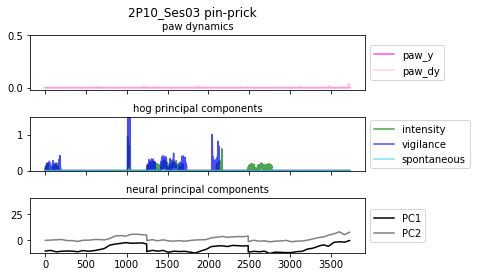

approach


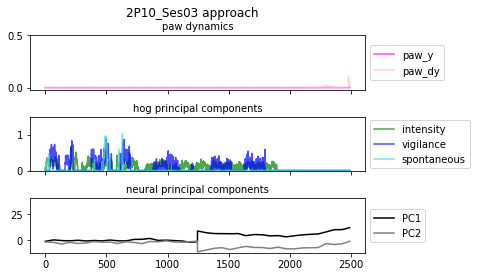

no stim


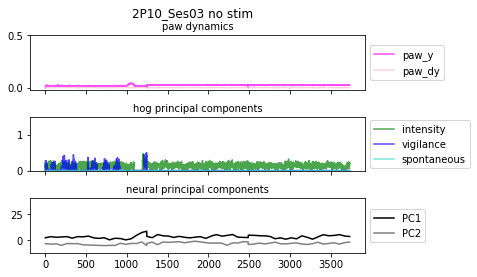

processing:  pca_data_up_2P10_Ses04.csv
2P10_Ses04
pca shape (27368, 441)
warm


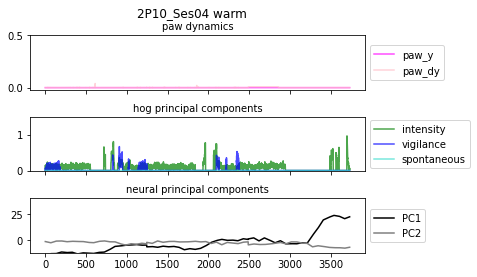

hot


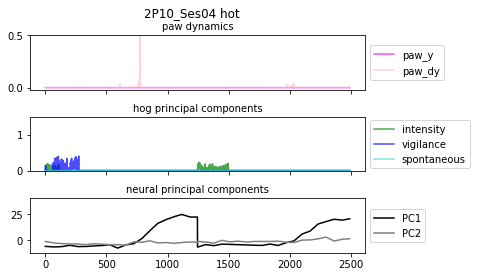

opto


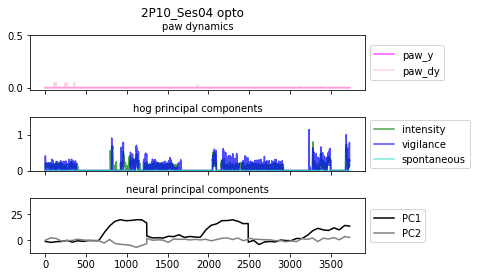

off-target


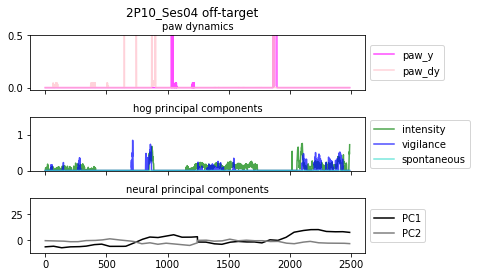

von frey


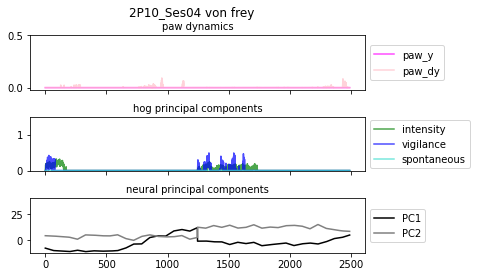

pin-prick


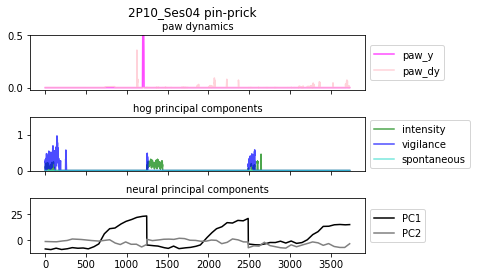

approach


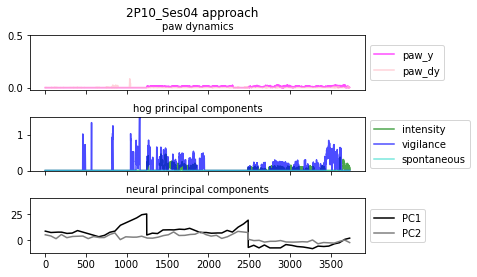

no stim


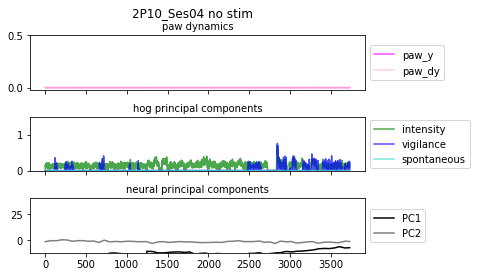

processing:  pca_data_up_2P09_Ses05.csv
2P09_Ses05
pca shape (29856, 481)
warm


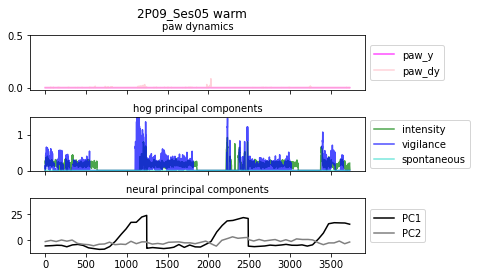

hot


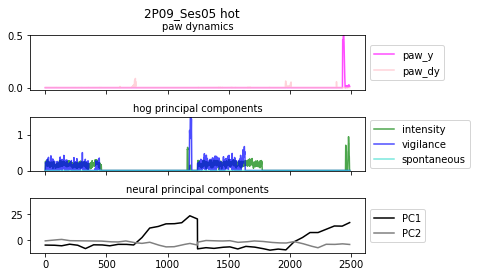

opto


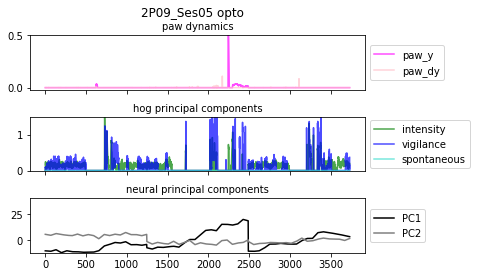

off-target


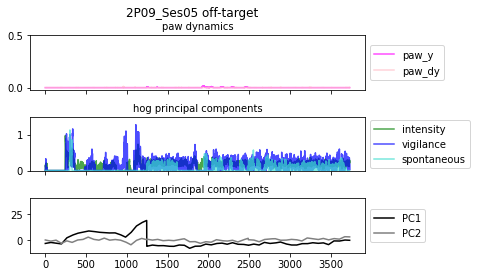

von frey


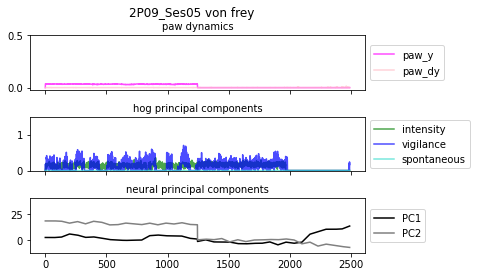

pin-prick


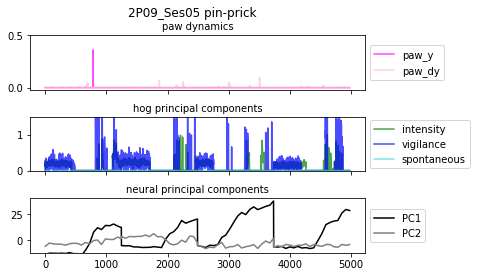

approach


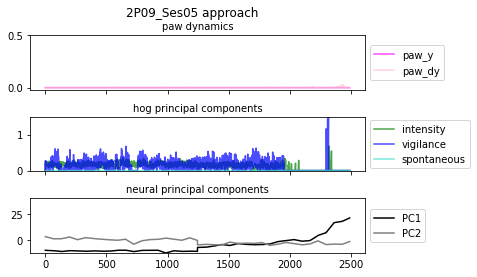

no stim


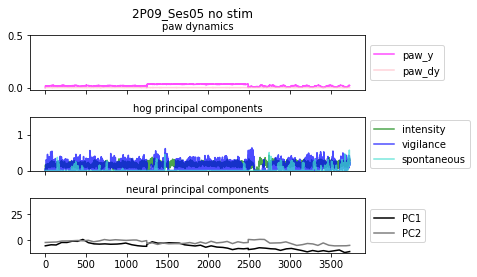

processing:  pca_data_up_2P10_Ses05.csv
2P10_Ses05
pca shape (29856, 481)
warm


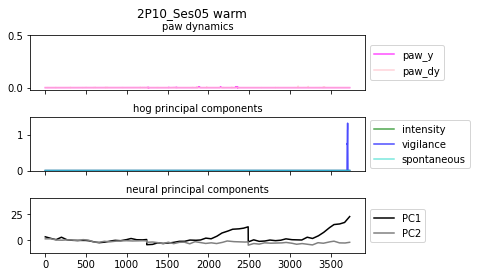

hot


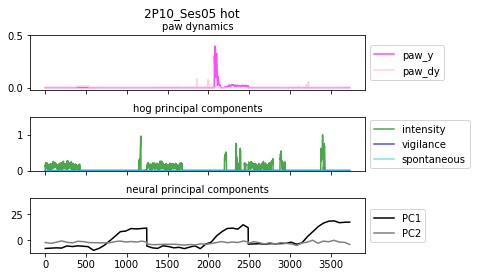

opto


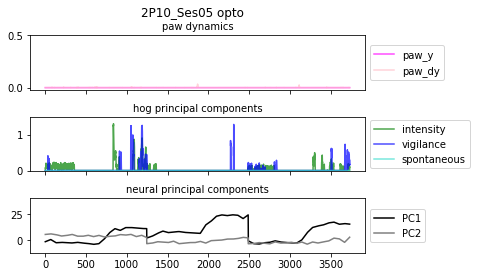

off-target


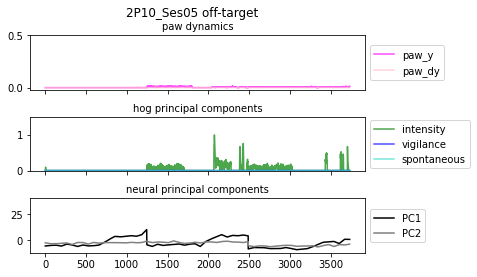

von frey


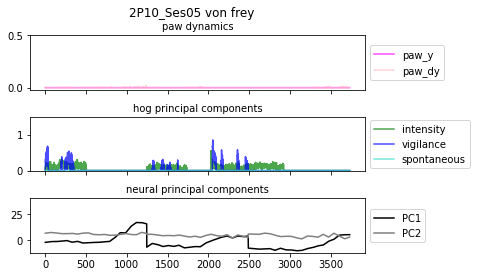

pin-prick


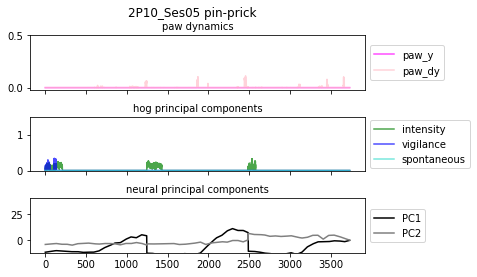

approach


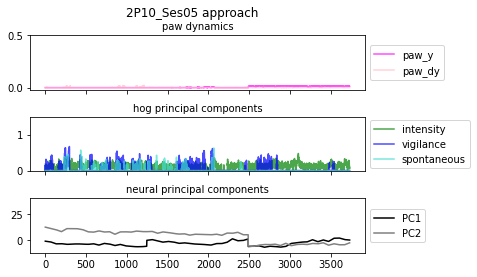

no stim


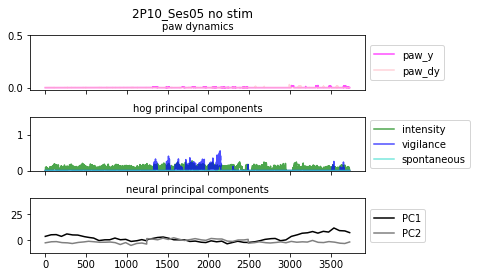

processing:  pca_data_up_2P11_Ses06.csv
2P11_Ses06
pca shape (29856, 465)
warm


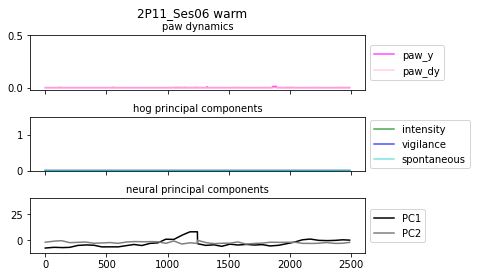

hot


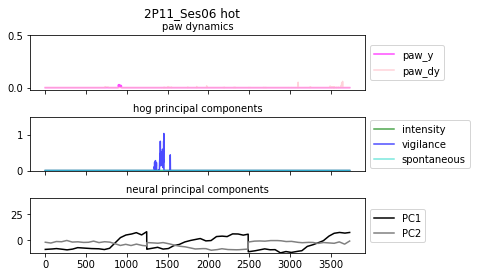

opto


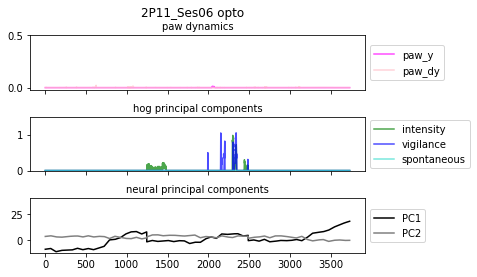

off-target


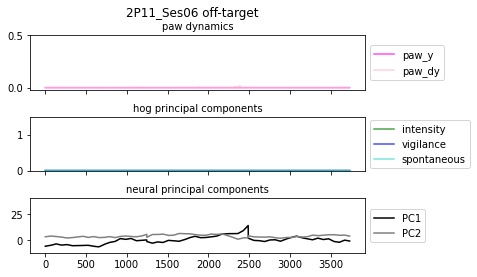

von frey


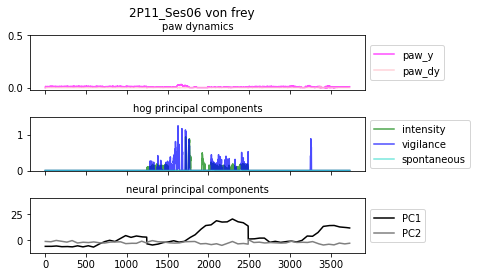

pin-prick


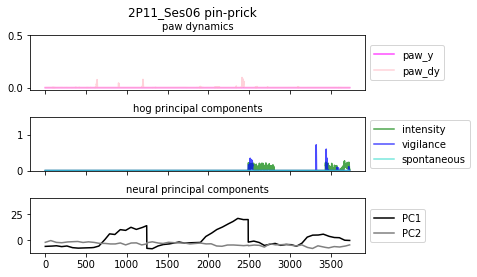

approach


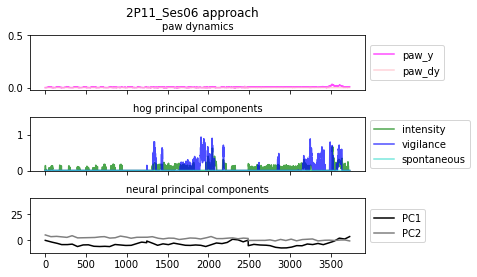

no stim


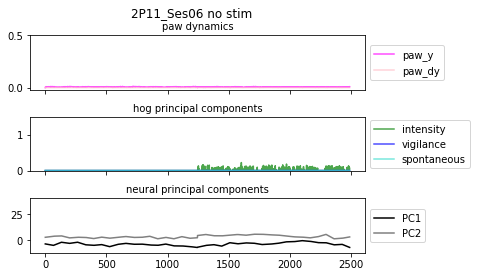

processing:  pca_data_up_2P11_CFA.csv
2P11_CFA
pca shape (28612, 461)
warm


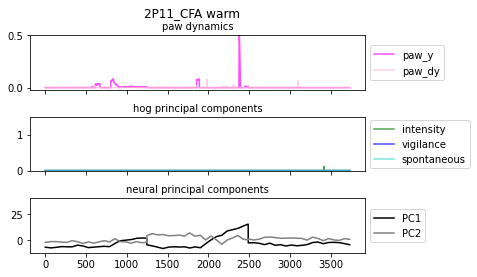

hot


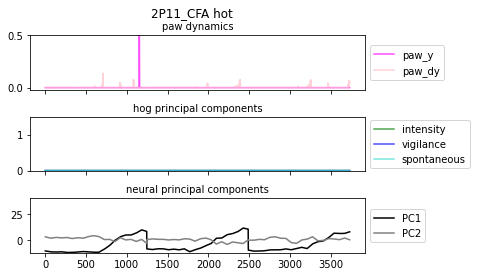

opto


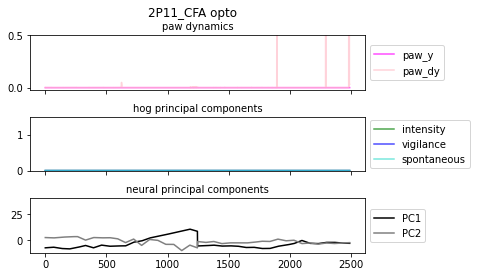

off-target


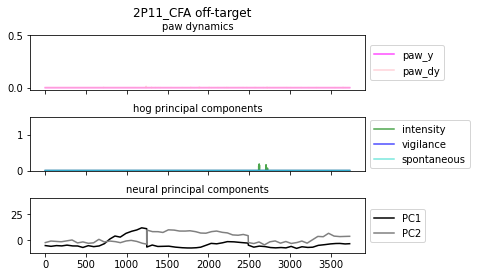

von frey


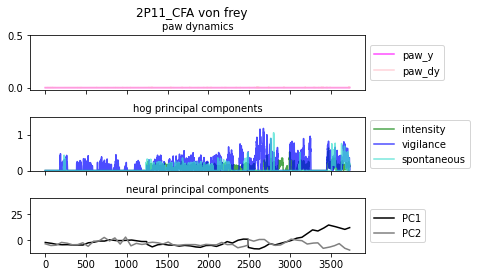

pin-prick


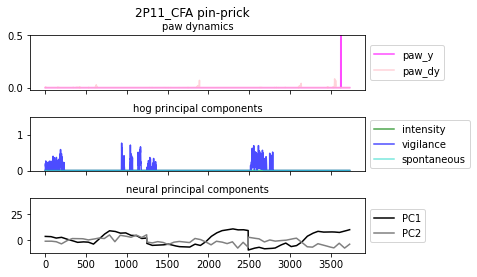

approach


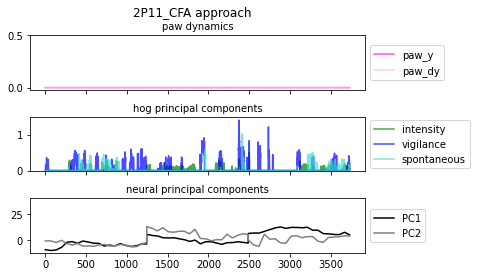

processing:  pca_data_up_2P05_Ses03.csv
2P05_Ses03
pca shape (29856, 481)
warm


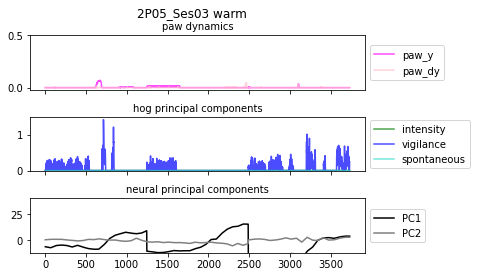

hot


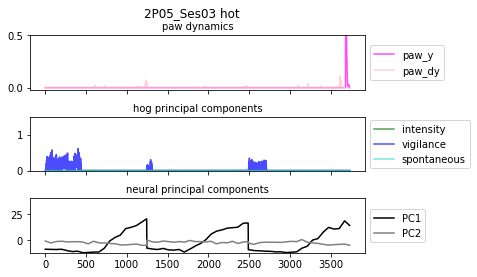

opto


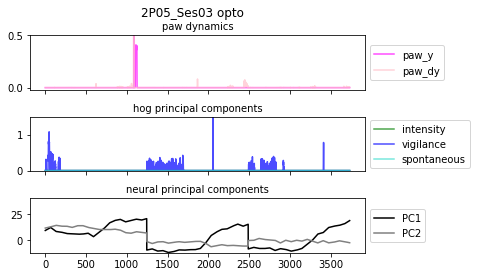

off-target


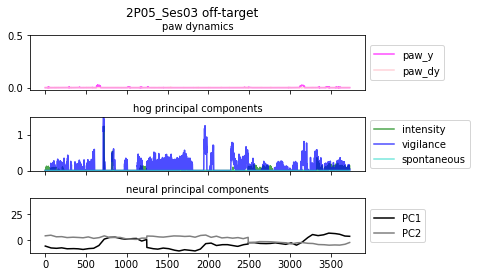

von frey


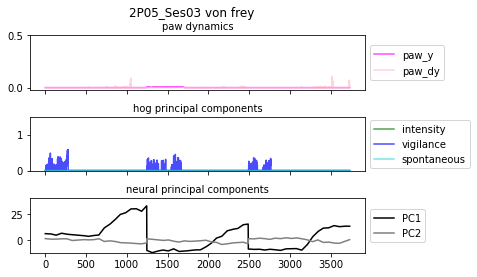

pin-prick


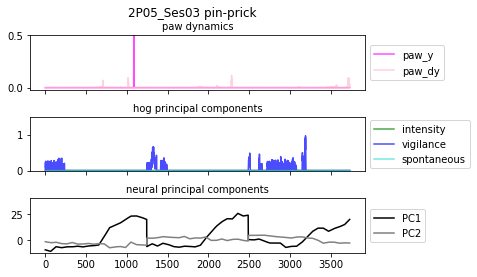

approach


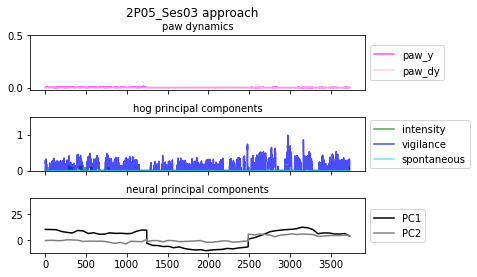

no stim


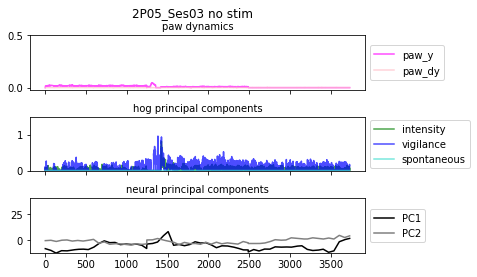

In [367]:
# CORRELATE WITH UP-SAMPLED NEURAL DATA PCA COMPONENTS 1 & 2
sessions = [session for session in os.listdir(input_path) if session.endswith('.csv')]
print(len(sessions))
session_names = []

li = []
for session in sessions:
    if session.startswith('._'): # circumventing issues with invisible files on external drives
        continue
        
    print('processing: ', session)
    entries = session.split('_')
    
    if session.endswith('CFA.csv'): 
        ses_name = entries[3]+'_'+entries[4][:3]
        
    else:
        ses_name = entries[3]+'_'+entries[4][:5]
            
    print(ses_name)
    session_names.append(ses_name)
    pca = pd.read_csv(os.path.join(input_path,session), index_col=0)
    print('pca shape', pca.shape)
    
    ses_trials = list(pca['identifier'].unique())
    
    for s in stimuli:
        repli_neu = pca[pca['identifier'].str.contains(s) & pca['identifier'].isin(com_trials)]
        repli_trials = list(repli_neu['identifier'].unique())
        if len(repli_trials)==0:
            continue
        else:
            repli_paw_y, repli_paw_dy, repli_hog_inten, repli_hog_vig, repli_hog_spon = pd.DataFrame(),pd.DataFrame(),pd.DataFrame(),pd.DataFrame(),pd.DataFrame()
            for r, rep_trial in enumerate(repli_trials):
                py = conv_paw_y[rep_trial]
                repli_paw_y = pd.concat((repli_paw_y, py), axis=0)
                pdy = conv_paw_dy[rep_trial]
                repli_paw_dy = pd.concat((repli_paw_dy, pdy), axis=0)
                inten = conv_hog_inten[rep_trial]
                repli_hog_inten = pd.concat((repli_hog_inten, inten), axis=0)
                vig = conv_hog_vig[rep_trial]
                repli_hog_vig = pd.concat((repli_hog_vig, vig), axis=0)
                spon = conv_hog_spon[rep_trial]
                repli_hog_spon = pd.concat((repli_hog_spon, spon), axis=0)
                
            print(s)    
            fig, axs = plt.subplots(3, 1, sharex=True)
            fig.suptitle(ses_name+' '+s, fontsize=12)
            fig.subplots_adjust(hspace=0.5)

            axs[0].plot(np.array(repli_paw_y), color='magenta', alpha=0.7, label='paw_y')
            axs[0].plot(np.array(repli_paw_dy), color='pink', alpha=0.7, label='paw_dy')
            axs[0].set_title('paw dynamics', fontsize=10)
            axs[0].set_ylim([-0.02, 0.5])
            axs[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
            
            axs[1].plot(np.array(repli_hog_inten), color='green', alpha=0.7, label='intensity')
            axs[1].plot(np.array(repli_hog_vig), color='blue', alpha=0.7, label='vigilance')
            axs[1].plot(np.array(repli_hog_spon), color='turquoise', alpha=0.7, label='spontaneous')
            axs[1].set_title('hog principal components', fontsize=10)
            axs[1].set_ylim([-0.02, 1.5])
            axs[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
            
            axs[2].plot(np.array(repli_neu.iloc[:,0]), color='black', label='PC1')
            axs[2].plot(np.array(repli_neu.iloc[:,1]), color='grey', label='PC2')
            axs[2].set_title('neural principal components', fontsize=10)
            axs[2].set_ylim([-12, 40])
            axs[2].legend(loc='center left', bbox_to_anchor=(1, 0.5))
            
            plt.savefig(os.path.join(output_path, ses_name+'_'+s+'traces.png'), bbox_inches='tight')
            #plt.ylim(-0.01, 1.5)
            plt.show()
            
        
#             # Correlations with neural PC1
#             y,_ = pearsonr(repli_paw_y[0], repli_neu.iloc[:,0])
#             dy,_ = pearsonr(repli_paw_dy[0], repli_neu.iloc[:,0])
#             intensity,_ = pearsonr(repli_hog_inten[0], repli_neu.iloc[:,0])
#             vigilance,_ = pearsonr(repli_hog_vig[0], repli_neu.iloc[:,0])
#             spontaneous,_ = pearsonr(repli_hog_spon[0], repli_neu.iloc[:,0])
#             li.append([ses_name, s, 'PC1', y, dy, intensity, vigilance, spontaneous])
        
#             # Correlations with neural PC2
#             y,_ = pearsonr(repli_paw_y[0], repli_neu.iloc[:,1])
#             dy,_ = pearsonr(repli_paw_dy[0], repli_neu.iloc[:,1])
#             intensity,_ = pearsonr(repli_hog_inten[0], repli_neu.iloc[:,1])
#             vigilance,_ = pearsonr(repli_hog_vig[0], repli_neu.iloc[:,1])
#             spontaneous,_ = pearsonr(repli_hog_spon[0], repli_neu.iloc[:,1])
#             li.append([ses_name, s, 'PC2', y, dy, intensity, vigilance, spontaneous])
                  
# corr = pd.DataFrame(li, columns=('session', 'modality', 'PC #','R_y','R_dy', 'R_inten', 'R_vig', 'R_spon'))
        

In [342]:
corr = pd.DataFrame(li, columns=('session', 'modality', 'PC #','R_y','R_dy', 'R_inten', 'R_vig', 'R_spon'))
corr['mouse'] = corr['session'].apply(lambda x: x[:4])
corr['cfa'] = corr['session'].apply(lambda x: 'cfa' if 'CFA' in x else 'health')
corr.to_csv(os.path.join(output_path, '2P_PCA_to_Beh_Corr.csv'))

In [336]:
PC1 = corr[(corr['PC #']=='PC1')]
PC2 = corr[(corr['PC #']=='PC2')]
PC2

,session,modality,PC #,R_y,R_dy,R_inten,R_vig,R_spon,mouse,cfa
1,2P06_Ses01,warm,PC2,-0.005734,-0.109966,-0.099829,-0.116084,NaN,2P06,health
3,2P06_Ses01,hot,PC2,0.032397,-0.042657,0.037702,0.000689,NaN,2P06,health
5,2P06_Ses01,off-target,PC2,-0.481971,0.047850,NaN,0.006735,NaN,2P06,health
7,2P06_Ses01,von frey,PC2,0.015802,-0.019290,NaN,0.197983,NaN,2P06,health
9,2P06_Ses01,pin-prick,PC2,-0.123056,0.084117,0.073280,-0.158234,NaN,2P06,health
...,...,...,...,...,...,...,...,...,...,...
657,2P05_Ses03,off-target,PC2,-0.102419,0.047363,-0.228427,0.123271,NaN,2P05,health
659,2P05_Ses03,von frey,PC2,0.077731,-0.104155,NaN,0.227004,NaN,2P05,health
661,2P05_Ses03,pin-prick,PC2,-0.023167,-0.054453,NaN,0.231435,NaN,2P05,health
663,2P05_Ses03,approach,PC2,-0.215914,0.034446,-0.076034,0.180776,NaN,2P05,health


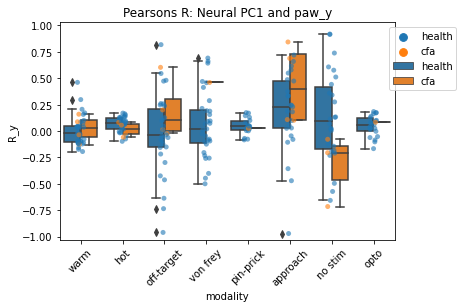

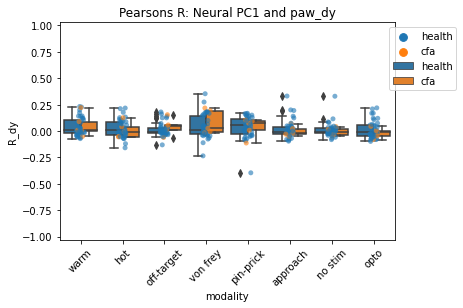

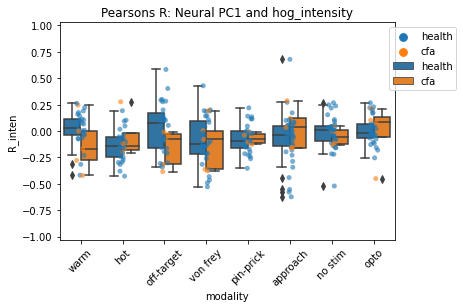

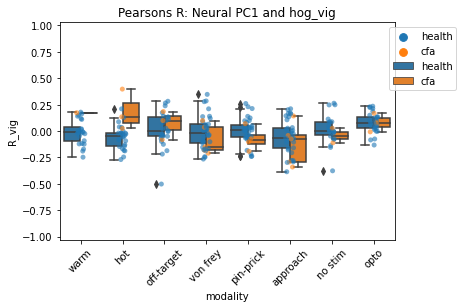

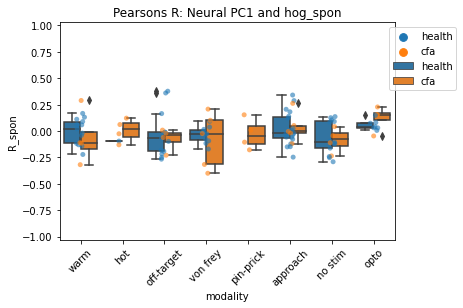

In [338]:
#PLOT CORRELATION BETWEEN NEURAL PC1 7 PC2 WITH PAW VECTORS AND HOG PCs
import seaborn as sns

ax = sns.stripplot(x='modality', y="R_y", hue='cfa', alpha=0.6, data=PC1)
ax = sns.boxplot(x='modality', y="R_y", hue='cfa', data=PC1)
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor= (1.2,1))
#ax.legend([],[], frameon=False)
plt.ylim(-1.03, 1.03)
plt.title('Pearsons R: Neural PC1 and paw_y')
plt.savefig(os.path.join(output_path, 'R_PC1_paw_y.png'), bbox_inches='tight')
plt.show()

ax = sns.stripplot(x='modality', y="R_dy", hue='cfa', alpha=0.6, data=PC1)
ax = sns.boxplot(x='modality', y="R_dy", hue='cfa', data=PC1)
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor= (1.2,1))
#ax.legend([],[], frameon=False)
plt.ylim(-1.03, 1.03)
plt.title('Pearsons R: Neural PC1 and paw_dy')
plt.savefig(os.path.join(output_path, 'R_PC1_paw_dy.png'), bbox_inches='tight')
plt.show()

ax = sns.stripplot(x='modality', y="R_inten", hue='cfa', alpha=0.6, data=PC1)
ax = sns.boxplot(x='modality', y="R_inten", hue='cfa', data=PC1)
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor= (1.2,1))
#ax.legend([],[], frameon=False)
plt.ylim(-1.03, 1.03)
plt.title('Pearsons R: Neural PC1 and hog_intensity')
plt.savefig(os.path.join(output_path, 'R_PC1_intensity.png'), bbox_inches='tight')
plt.show()

ax = sns.stripplot(x='modality', y="R_vig", hue='cfa', alpha=0.6, data=PC1)
ax = sns.boxplot(x='modality', y="R_vig", hue='cfa', data=PC1)
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor= (1.2,1))
#ax.legend([],[], frameon=False)
plt.ylim(-1.03, 1.03)
plt.title('Pearsons R: Neural PC1 and hog_vig')
plt.savefig(os.path.join(output_path, 'R_PC1_vig.png'), bbox_inches='tight')
plt.show()

ax = sns.stripplot(x='modality', y="R_spon", hue='cfa',alpha=0.6, data=PC1)
ax = sns.boxplot(x='modality', y="R_spon", hue='cfa', data=PC1)
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor= (1.2,1))
#ax.legend([],[], frameon=False)
plt.ylim(-1.03, 1.03)
plt.title('Pearsons R: Neural PC1 and hog_spon')
plt.savefig(os.path.join(output_path, 'R_PC1_spon.png'), bbox_inches='tight')
plt.show()

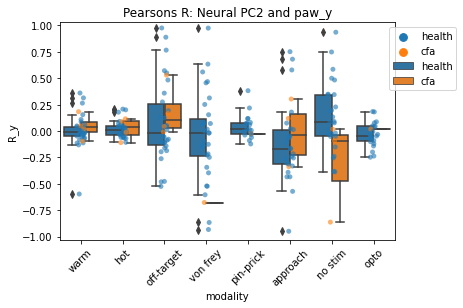

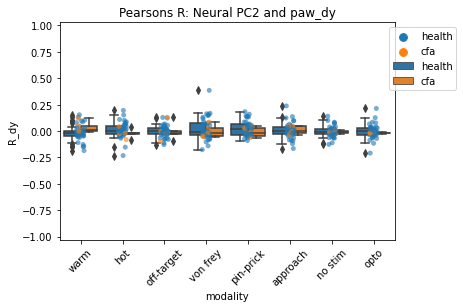

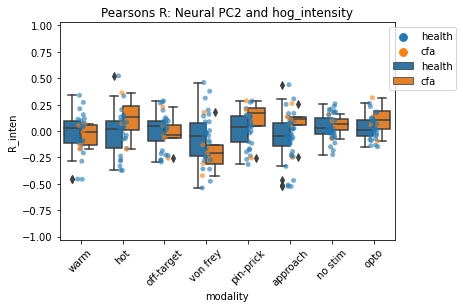

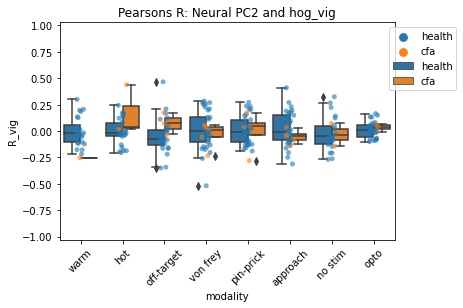

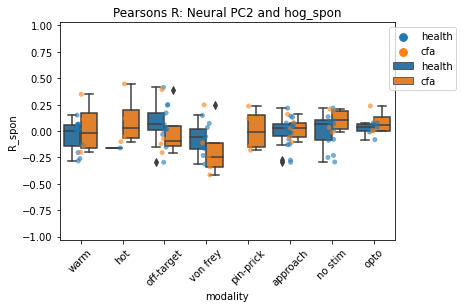

In [339]:
ax = sns.stripplot(x='modality', y="R_y", hue='cfa', alpha=0.6, data=PC2)
ax = sns.boxplot(x='modality', y="R_y", hue='cfa', data=PC2)
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor= (1.2,1))
#ax.legend([],[], frameon=False)
plt.ylim(-1.03, 1.03)
plt.title('Pearsons R: Neural PC2 and paw_y')
plt.savefig(os.path.join(output_path, 'R_PC2_paw_y.png'), bbox_inches='tight')
plt.show()

ax = sns.stripplot(x='modality', y="R_dy", hue='cfa', alpha=0.6, data=PC2)
ax = sns.boxplot(x='modality', y="R_dy", hue='cfa', data=PC2)
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor= (1.2,1))
#ax.legend([],[], frameon=False)
plt.ylim(-1.03, 1.03)
plt.title('Pearsons R: Neural PC2 and paw_dy')
plt.savefig(os.path.join(output_path, 'R_PC2_paw_dy.png'), bbox_inches='tight')
plt.show()

ax = sns.stripplot(x='modality', y="R_inten", hue='cfa', alpha=0.6, data=PC2)
ax = sns.boxplot(x='modality', y="R_inten", hue='cfa', data=PC2)
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor= (1.2,1))
#ax.legend([],[], frameon=False)
plt.ylim(-1.03, 1.03)
plt.title('Pearsons R: Neural PC2 and hog_intensity')
plt.savefig(os.path.join(output_path, 'R_PC2_intensity.png'), bbox_inches='tight')
plt.show()

ax = sns.stripplot(x='modality', y="R_vig", hue='cfa', alpha=0.6, data=PC2)
ax = sns.boxplot(x='modality', y="R_vig", hue='cfa', data=PC2)
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor= (1.2,1))
#ax.legend([],[], frameon=False)
plt.ylim(-1.03, 1.03)
plt.title('Pearsons R: Neural PC2 and hog_vig')
plt.savefig(os.path.join(output_path, 'R_PC2_vig.png'), bbox_inches='tight')
plt.show()

ax = sns.stripplot(x='modality', y="R_spon", hue='cfa',alpha=0.6, data=PC2)
ax = sns.boxplot(x='modality', y="R_spon", hue='cfa', data=PC2)
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor= (1.2,1))
#ax.legend([],[], frameon=False)
plt.ylim(-1.03, 1.03)
plt.title('Pearsons R: Neural PC2 and hog_spon')
plt.savefig(os.path.join(output_path, 'R_PC2_spon.png'), bbox_inches='tight')
plt.show()

In [340]:
repli_neu.iloc[:,1]

0      -0.366142
1      -0.360063
2      -0.353984
3      -0.347905
4      -0.341826
          ...   
1239    4.109524
1240    4.135254
1241    4.160984
1242    4.186715
1243    4.212445
Name: 2P05_Ses03_1, Length: 3732, dtype: float64